In [ ]:
import pandas as pd

In [ ]:
df = pd.read_csv('heart.csv')

In [ ]:
df.head()

,HeartDiseaseorAttack,HighBP,HighChol,CholCheck,BMI,Smoker,Stroke,Diabetes,PhysActivity,Fruits,...,AnyHealthcare,NoDocbcCost,GenHlth,MentHlth,PhysHlth,DiffWalk,Sex,Age,Education,Income
0,0.0,1.0,1.0,1.0,40.0,1.0,0.0,0.0,0.0,0.0,...,1.0,0.0,5.0,18.0,15.0,1.0,0.0,9.0,4.0,3.0
1,0.0,0.0,0.0,0.0,25.0,1.0,0.0,0.0,1.0,0.0,...,0.0,1.0,3.0,0.0,0.0,0.0,0.0,7.0,6.0,1.0
2,0.0,1.0,1.0,1.0,28.0,0.0,0.0,0.0,0.0,1.0,...,1.0,1.0,5.0,30.0,30.0,1.0,0.0,9.0,4.0,8.0
3,0.0,1.0,0.0,1.0,27.0,0.0,0.0,0.0,1.0,1.0,...,1.0,0.0,2.0,0.0,0.0,0.0,0.0,11.0,3.0,6.0
4,0.0,1.0,1.0,1.0,24.0,0.0,0.0,0.0,1.0,1.0,...,1.0,0.0,2.0,3.0,0.0,0.0,0.0,11.0,5.0,4.0


In [ ]:
X=df.iloc[:,1:22]
y=df.iloc[:,0]
print("X - ", X.shape, "\ny - ", y.shape)

X -  (253680, 21) 
y -  (253680,)


In [ ]:
X.isnull().sum()

HighBP               0
HighChol             0
CholCheck            0
BMI                  0
Smoker               0
Stroke               0
Diabetes             0
PhysActivity         0
Fruits               0
Veggies              0
HvyAlcoholConsump    0
AnyHealthcare        0
NoDocbcCost          0
GenHlth              0
MentHlth             0
PhysHlth             0
DiffWalk             0
Sex                  0
Age                  0
Education            0
Income               0
dtype: int64

Logistic Regression with Random Search

In [ ]:
from sklearn.model_selection import RandomizedSearchCV
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
import numpy as np
import time

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

param_distributions = {
    'C': [0.001, 0.01, 0.1, 1, 10, 100, 1000],
    'penalty': ['l2', 'none']
}

# Create a Logistic Regression model
logreg = LogisticRegression()

start_time = time.time()
# Perform Random Search Cross Validation
random_search = RandomizedSearchCV(logreg, param_distributions, n_iter=10, cv=5, random_state=42)
random_search.fit(X_train, y_train)
end_time = time.time()
# Print the best hyperparameters and accuracy
print("Best Hyperparameters:", random_search.best_params_)
print("Best Accuracy:", random_search.best_score_)

# Evaluate the model on the test data
test_accuracy = random_search.score(X_test, y_test)
print("Test Accuracy:", test_accuracy)
print("Execution Time: {:.2f} seconds".format(end_time - start_time))

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:1173: FutureWarning: `penalty='none'`has been deprecated in 1.2 and will be removed in 1.4. To keep the past behaviour, set `penalty=None`.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:1181: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:1173: Futur

Best Hyperparameters: {'penalty': 'l2', 'C': 0.001}
Best Accuracy: 0.9073783894089171
Test Accuracy: 0.907718385367392
Execution Time: 108.39 seconds


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


ROC curve and Metrics

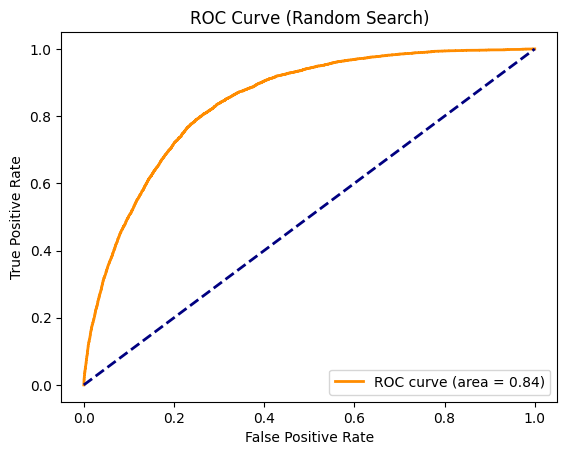

Specificity (Random Search): 0.99
Sensitivity (Random Search): 0.09
NPV (Random Search): 0.91
PPV (Random Search): 0.56


In [ ]:
from sklearn.metrics import roc_curve, auc, confusion_matrix
import matplotlib.pyplot as plt


# Get the predicted probabilities for the positive class
y_prob_random = random_search.predict_proba(X_test)[:, 1]

# Calculate ROC curve and AUC
fpr_random, tpr_random, _ = roc_curve(y_test, y_prob_random)
roc_auc_random = auc(fpr_random, tpr_random)

# Plot ROC curve
plt.figure()
plt.plot(fpr_random, tpr_random, color='darkorange', lw=2, label='ROC curve (area = {:.2f})'.format(roc_auc_random))
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve (Random Search)')
plt.legend(loc='lower right')
plt.show()

# Calculate confusion matrix
y_pred_random = random_search.predict(X_test)
conf_matrix_random = confusion_matrix(y_test, y_pred_random)

# Calculate specificity, sensitivity, NPV, and PPV
specificity_random = conf_matrix_random[0, 0] / (conf_matrix_random[0, 0] + conf_matrix_random[0, 1])
sensitivity_random = conf_matrix_random[1, 1] / (conf_matrix_random[1, 0] + conf_matrix_random[1, 1])
npv_random = conf_matrix_random[0, 0] / (conf_matrix_random[0, 0] + conf_matrix_random[1, 0])
ppv_random = conf_matrix_random[1, 1] / (conf_matrix_random[0, 1] + conf_matrix_random[1, 1])

print("Specificity (Random Search): {:.2f}".format(specificity_random))
print("Sensitivity (Random Search): {:.2f}".format(sensitivity_random))
print("NPV (Random Search): {:.2f}".format(npv_random))
print("PPV (Random Search): {:.2f}".format(ppv_random))


Loogistic Regression with Grid Search

In [ ]:
from sklearn.model_selection import GridSearchCV
from sklearn.linear_model import LogisticRegression
import time
# Load your data and split it into features X and target y
# X_train, X_test, y_train, y_test = ...
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Define the hyperparameters and their possible values for grid search
param_grid = {
    'C': [0.001, 0.01, 0.1, 1, 10, 100],
    'penalty': ['l2', 'none']
}

# Create a Logistic Regression model
logreg = LogisticRegression(solver='lbfgs')
start_time = time.time()

# Perform Grid Search Cross Validation
grid_search = GridSearchCV(logreg, param_grid, cv=5)
grid_search.fit(X_train, y_train)
end_time = time.time()

# Print the best hyperparameters and accuracy
print("Best Hyperparameters:", grid_search.best_params_)
print("Best Accuracy:", grid_search.best_score_)
test_accuracy = random_search.score(X_test, y_test)
print("Test Accuracy:", test_accuracy)
print("Execution Time: {:.2f} seconds".format(end_time - start_time))

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _c

Best Hyperparameters: {'C': 0.001, 'penalty': 'l2'}
Best Accuracy: 0.9073783894089171
Test Accuracy: 0.907718385367392
Execution Time: 144.43 seconds


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


ROC Curve and Metrics

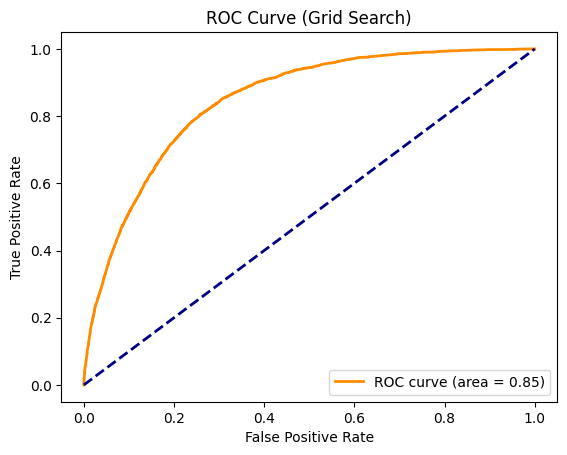

Specificity (Grid Search): 0.99
Sensitivity (Grid Search): 0.10
NPV (Grid Search): 0.91
PPV (Grid Search): 0.58


In [ ]:
from sklearn.metrics import roc_curve, auc, confusion_matrix
import matplotlib.pyplot as plt


# Get the predicted probabilities for the positive class
y_prob_grid = grid_search.predict_proba(X_test)[:, 1]

# Calculate ROC curve and AUC
fpr_grid, tpr_grid, _ = roc_curve(y_test, y_prob_grid)
roc_auc_grid = auc(fpr_grid, tpr_grid)

# Plot ROC curve
plt.figure()
plt.plot(fpr_grid, tpr_grid, color='darkorange', lw=2, label='ROC curve (area = {:.2f})'.format(roc_auc_grid))
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve (Grid Search)')
plt.legend(loc='lower right')
plt.show()

# Calculate confusion matrix
y_pred_grid = grid_search.predict(X_test)
conf_matrix_grid = confusion_matrix(y_test, y_pred_grid)

# Calculate specificity, sensitivity, NPV, and PPV
specificity_grid = conf_matrix_grid[0, 0] / (conf_matrix_grid[0, 0] + conf_matrix_grid[0, 1])
sensitivity_grid = conf_matrix_grid[1, 1] / (conf_matrix_grid[1, 0] + conf_matrix_grid[1, 1])
npv_grid = conf_matrix_grid[0, 0] / (conf_matrix_grid[0, 0] + conf_matrix_grid[1, 0])
ppv_grid = conf_matrix_grid[1, 1] / (conf_matrix_grid[0, 1] + conf_matrix_grid[1, 1])

print("Specificity (Grid Search): {:.2f}".format(specificity_grid))
print("Sensitivity (Grid Search): {:.2f}".format(sensitivity_grid))
print("NPV (Grid Search): {:.2f}".format(npv_grid))
print("PPV (Grid Search): {:.2f}".format(ppv_grid))


LightGBM using Random Search

In [ ]:
import lightgbm as lgb
from sklearn.model_selection import RandomizedSearchCV
from sklearn.model_selection import train_test_split
from scipy.stats import randint as sp_randint
import time


# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Define the parameter grid for RandomizedSearchCV
param_dist = {
    'boosting_type': ['gbdt', 'dart', 'goss'],
    'num_leaves': [30],
    'learning_rate': [0.01, 0.05, 0.1],
    'n_estimators': [100, 150, 200],
    'subsample': [0.6, 0.7, 0.8],
    'colsample_bytree': [0.6, 0.7, 0.8],
    'reg_alpha': [0, 0.1, 1],
    'reg_lambda': [0, 0.1, 1]
}

# Create a base LightGBM model
lgb_model = lgb.LGBMClassifier(random_state=42)

# Initialize RandomizedSearchCV
random_search = RandomizedSearchCV(
    estimator=lgb_model,
    param_distributions=param_dist,
    n_iter=10,  # Number of parameter settings that are sampled
    scoring='accuracy',  # Use appropriate scoring metric
    cv=5,  # Number of cross-validation folds
    n_jobs=-1,  # Use all available CPU cores
    random_state=42
)

# Measure the start time
start_time = time.time()

# Perform the random search on the training data
# Perform the random search on the training data
random_search.fit(X_train, y_train)

# Get the best estimator from RandomizedSearchCV
best_lgb_model = random_search.best_estimator_

# Predict probabilities on the test set using the best model
y_proba = best_lgb_model.predict_proba(X_test)[:, 1]


# Measure the end time
end_time = time.time()

# Calculate the execution time
execution_time = end_time - start_time

# Print the execution time
print("Execution Time: {:.2f} seconds".format(execution_time))

# Print the best parameters and corresponding score
print("Best Parameters: ", random_search.best_params_)
print("Best Score: ", random_search.best_score_)
# Evaluate the best model on the test set
best_model = random_search.best_estimator_
test_accuracy = best_model.score(X_test, y_test)
print("Test Accuracy: ", test_accuracy)
print("Execution time: ", execution_time)

[LightGBM] [Info] Number of positive: 19125, number of negative: 183819
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.053462 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 203
[LightGBM] [Info] Number of data points in the train set: 202944, number of used features: 21
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.094238 -> initscore=-2.262955
[LightGBM] [Info] Start training from score -2.262955
Execution Time: 553.86 seconds
Best Parameters:  {'subsample': 0.6, 'reg_lambda': 1, 'reg_alpha': 0, 'num_leaves': 30, 'n_estimators': 100, 'learning_rate': 0.05, 'colsample_bytree': 0.7, 'boosting_type': 'gbdt'}
Best Score:  0.9081470761631604
Test Accuracy:  0.90819142226427
Execution time:  553.8583691120148


ROC Curve and Metrics

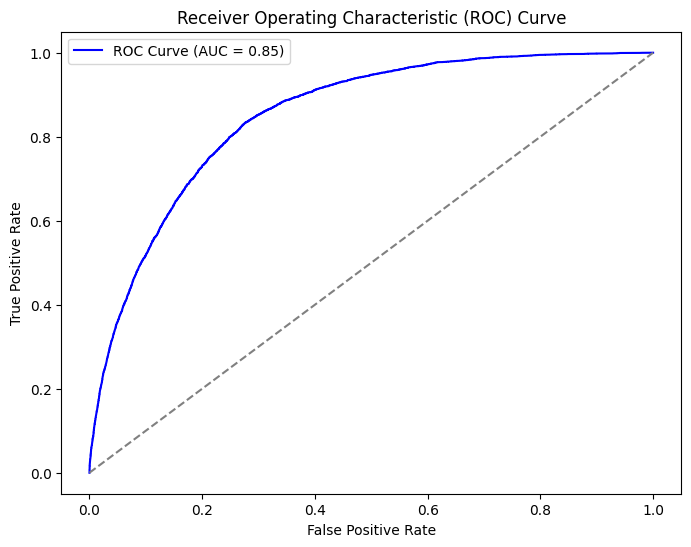

Sensitivity (True Positive Rate): 0.08
Specificity (True Negative Rate): 0.99
Positive Predictive Value (PPV): 0.58
Negative Predictive Value (NPV): 0.91


In [ ]:
import lightgbm as lgb
from sklearn.metrics import roc_curve, roc_auc_score, confusion_matrix

# Calculate ROC curve
fpr, tpr, thresholds = roc_curve(y_test, y_proba)

# Calculate AUC (Area Under the Curve) score
roc_auc = roc_auc_score(y_test, y_proba)

# Plot ROC curve
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='b', label='ROC Curve (AUC = {:.2f})'.format(roc_auc))
plt.plot([0, 1], [0, 1], color='gray', linestyle='--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend()
plt.show()

# Predict binary classes based on a threshold (usually 0.5)
threshold = 0.5
y_pred = (y_proba >= threshold).astype(int)

# Calculate confusion matrix
conf_matrix = confusion_matrix(y_test, y_pred)

# Calculate sensitivity, specificity, PPV, NPV
tn, fp, fn, tp = conf_matrix.ravel()
sensitivity = tp / (tp + fn)
specificity = tn / (tn + fp)
ppv = tp / (tp + fp)
npv = tn / (tn + fn)

# Print the metrics
print("Sensitivity (True Positive Rate): {:.2f}".format(sensitivity))
print("Specificity (True Negative Rate): {:.2f}".format(specificity))
print("Positive Predictive Value (PPV): {:.2f}".format(ppv))
print("Negative Predictive Value (NPV): {:.2f}".format(npv))

LightGBM using Grid Search

In [ ]:
import lightgbm as lgb
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.metrics import accuracy_score, roc_curve, roc_auc_score, confusion_matrix
import matplotlib.pyplot as plt
import time

# Assuming your data is loaded in X (features) and y (target variable)

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Define the parameter grid for GridSearchCV
param_grid = {
    'boosting_type': ['gbdt', 'dart', 'goss'],
    'num_leaves': [30],
    'learning_rate': [0.01, 0.05, 0.1],
    'n_estimators': [100, 150, 200],
    'subsample': [0.6, 0.7, 0.8],
    'colsample_bytree': [0.6, 0.7, 0.8],
    'reg_alpha': [0, 0.1, 1],
    'reg_lambda': [0, 0.1, 1]
}
# Create the LightGBM model
lgb_model = lgb.LGBMClassifier(random_state=42)

# Initialize GridSearchCV
grid_search = GridSearchCV(
    estimator=lgb_model,
    param_grid=param_grid,
    scoring='accuracy',  # Use appropriate scoring metric
    cv=5,  # Number of cross-validation folds
    n_jobs=-1  # Use all available CPU cores
)

# Measure the start time
start_time = time.time()

# Fit the model using GridSearchCV on the training data
grid_search.fit(X_train, y_train)

# Measure the end time
end_time = time.time()

# Calculate the execution time
execution_time = end_time - start_time

# Get the best estimator from GridSearchCV
best_lgb_model = grid_search.best_estimator_

# Predict on the test set using the best model
y_pred = best_lgb_model.predict(X_test)

# Calculate test accuracy
test_accuracy = accuracy_score(y_test, y_pred)

# Rest of the code for ROC curve, confusion matrix, and metrics calculation remains the same as before...

# Print the execution time and test accuracy
print("Execution Time: {:.2f} seconds".format(execution_time))
print("Test Accuracy: {:.2f}".format(test_accuracy))

# Print the best parameters and corresponding score
print("Best Parameters: ", grid_search.best_params_)
print("Best Score: ", grid_search.best_score_)


KeyboardInterrupt: ignored

Random Forest with Random Search

In [ ]:
from sklearn.model_selection import RandomizedSearchCV, StratifiedKFold
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
import numpy as np
import time

# Assuming you have X and y defined for your features and target variable
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Define a broader range of hyperparameters for Random Forest
param_distributions = {
    'n_estimators': [50, 100, 150, 200],  # Number of trees in the forest
    'max_depth': [None, 10, 20, 30],  # Maximum depth of the tree
    'min_samples_split': [2, 5, 10],  # Minimum number of samples required to split an internal node
    'min_samples_leaf': [1, 2, 4]  # Minimum number of samples required to be at a leaf node
}

# Create a Random Forest model
rf = RandomForestClassifier(random_state=42)

# Define StratifiedKFold cross-validator with 5 splits
stratified_kfold = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

start_time = time.time()
# Perform Random Search Cross Validation for Random Forest with custom cross-validator
random_search = RandomizedSearchCV(rf, param_distributions, n_iter=10, cv=stratified_kfold, random_state=42)
random_search.fit(X_train, y_train)
end_time = time.time()

# Print the best hyperparameters and accuracy
print("Best Hyperparameters:", random_search.best_params_)
print("Best Accuracy:", random_search.best_score_)

# Evaluate the model on the test data
test_accuracy = random_search.score(X_test, y_test)
print("Test Accuracy:", test_accuracy)
print("Execution Time: {:.2f} seconds".format(end_time - start_time))


Best Hyperparameters: {'n_estimators': 50, 'min_samples_split': 2, 'min_samples_leaf': 4, 'max_depth': 30}
Best Accuracy: 0.9076149100911663
Test Accuracy: 0.908033743298644
Execution Time: 875.06 seconds


AdaBoost with Random Search

In [ ]:
from sklearn.ensemble import AdaBoostClassifier
from sklearn.model_selection import RandomizedSearchCV
from sklearn.metrics import accuracy_score, roc_auc_score, roc_curve, confusion_matrix
from sklearn.metrics import precision_score, recall_score, f1_score

# Assuming your data is loaded in X (features) and y (target variable)

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Define the parameter distribution for RandomizedSearchCV
param_dist = {
    'n_estimators': [50, 100, 150, 200],  # Number of weak learners (base estimators)
    'learning_rate': [0.1, 0.5, 1.0]  # Weight applied to each weak learner
}

# Create the AdaBoostClassifier model
adaboost = AdaBoostClassifier(random_state=42)

# Initialize RandomizedSearchCV
random_search = RandomizedSearchCV(
    estimator=adaboost,
    param_distributions=param_dist,
    n_iter=10,  # Number of parameter settings that are sampled
    scoring='accuracy',  # Use appropriate scoring metric
    cv=5,  # Number of cross-validation folds
    n_jobs=-1,  # Use all available CPU cores
    random_state=42
)
start_time = time.time()
# Fit the model using RandomizedSearchCV on the training data
random_search.fit(X_train, y_train)
end_time = time.time()
tot_time = end_time - start_time
# Get the best estimator from RandomizedSearchCV
best_adaboost_random = random_search.best_estimator_

# Predict probabilities on the test set using the best model
y_proba_random = best_adaboost_random.predict_proba(X_test)[:, 1]

# Calculate ROC AUC score
roc_auc_random = roc_auc_score(y_test, y_proba_random)

# Generate ROC curve
fpr_random, tpr_random, thresholds_random = roc_curve(y_test, y_proba_random)

# Predict on the test set using the best model
y_pred_random = best_adaboost_random.predict(X_test)

# Calculate metrics
accuracy_random = accuracy_score(y_test, y_pred_random)
precision_random = precision_score(y_test, y_pred_random)
recall_random = recall_score(y_test, y_pred_random)
f1_random = f1_score(y_test, y_pred_random)

# Calculate confusion matrix
conf_matrix_random = confusion_matrix(y_test, y_pred_random)

# Print the results
print("Randomized Search Test Accuracy: {:.4f}".format(accuracy_random))
print("Randomized Search ROC AUC: {:.2f}".format(roc_auc_random))
print("Randomized Search Sensitivity (Recall): {:.2f}".format(recall_random))
print("Randomized Search Specificity: {:.2f}".format(conf_matrix_random[0, 0] / (conf_matrix_random[0, 0] + conf_matrix_random[0, 1])))
print("Randomized Search F1 Score: {:.2f}".format(f1_random))
print("Execution time: {:.2f}".format(tot_time))

Randomized Search Test Accuracy: 0.9086
Randomized Search ROC AUC: 0.85
Randomized Search Sensitivity (Recall): 0.10
Randomized Search Specificity: 0.99
Randomized Search F1 Score: 0.17
Execution time: 679.18


In [ ]:
npv_random = conf_matrix_random[0, 0] / (conf_matrix_random[0, 0] + conf_matrix_random[1, 0])
ppv_random = conf_matrix_random[1, 1] / (conf_matrix_random[0, 1] + conf_matrix_random[1, 1])
print("NPV and PPV are : ")
print(npv_random, ppv_random)

NPV and PPV are : 
0.9141929406105309 0.5763313609467455


<function matplotlib.pyplot.show(close=None, block=None)>

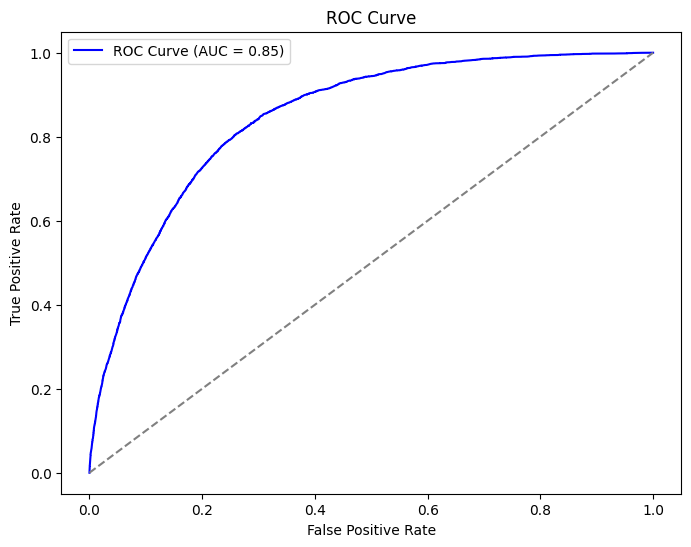

In [ ]:
import matplotlib.pyplot as plt
plt.figure(figsize=(8, 6))
plt.plot(fpr_random, tpr_random, color='b', label='ROC Curve (AUC = {:.2f})'.format(roc_auc_random))
plt.plot([0, 1], [0, 1], color='gray', linestyle='--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve')
plt.legend()
plt.show

AdaBoost with Grid Search

In [ ]:
from sklearn.ensemble import AdaBoostClassifier
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import accuracy_score, roc_auc_score, roc_curve, confusion_matrix
from sklearn.metrics import precision_score, recall_score, f1_score

# Assuming your data is loaded in X (features) and y (target variable)

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Define the parameter grid for GridSearchCV
param_grid = {
    'n_estimators': [50, 100, 150, 200],  # Number of weak learners (base estimators)
    'learning_rate': [0.1, 0.5, 1.0]  # Weight applied to each weak learner
}

# Create the AdaBoostClassifier model
adaboost = AdaBoostClassifier(random_state=42)

# Initialize GridSearchCV
grid_search = GridSearchCV(
    estimator=adaboost,
    param_grid=param_grid,
    scoring='accuracy',  # Use appropriate scoring metric
    cv=5,  # Number of cross-validation folds
    n_jobs=-1  # Use all available CPU cores
)

start_time = time.time()
# Fit the model using GridSearchCV on the training data
grid_search.fit(X_train, y_train)
end_time = time.time()
tot_time = end_time - start_time
# Get the best estimator from GridSearchCV
best_adaboost_grid = grid_search.best_estimator_

# Predict probabilities on the test set using the best model
y_proba_grid = best_adaboost_grid.predict_proba(X_test)[:, 1]

# Calculate ROC AUC score
roc_auc_grid = roc_auc_score(y_test, y_proba_grid)

# Generate ROC curve
fpr_grid, tpr_grid, thresholds_grid = roc_curve(y_test, y_proba_grid)

# Predict on the test set using the best model
y_pred_grid = best_adaboost_grid.predict(X_test)

# Calculate metrics
accuracy_grid = accuracy_score(y_test, y_pred_grid)
precision_grid = precision_score(y_test, y_pred_grid)
recall_grid = recall_score(y_test, y_pred_grid)
f1_grid = f1_score(y_test, y_pred_grid)

# Calculate confusion matrix
conf_matrix_grid = confusion_matrix(y_test, y_pred_grid)

# Print the results
print("Grid Search Test Accuracy: {:.4f}".format(accuracy_grid))
print("Grid Search ROC AUC: {:.2f}".format(roc_auc_grid))
print("Grid Search Sensitivity (Recall): {:.2f}".format(recall_grid))
print("Grid Search Specificity: {:.2f}".format(conf_matrix_grid[0, 0] / (conf_matrix_grid[0, 0] + conf_matrix_grid[0, 1])))
print("Grid Search F1 Score: {:.2f}".format(f1_grid))
print("Execution time: {:.2f}".format(tot_time))

Grid Search Test Accuracy: 0.9086
Grid Search ROC AUC: 0.85
Grid Search Sensitivity (Recall): 0.10
Grid Search Specificity: 0.99
Grid Search F1 Score: 0.17
Execution time: 873.98


<function matplotlib.pyplot.show(close=None, block=None)>

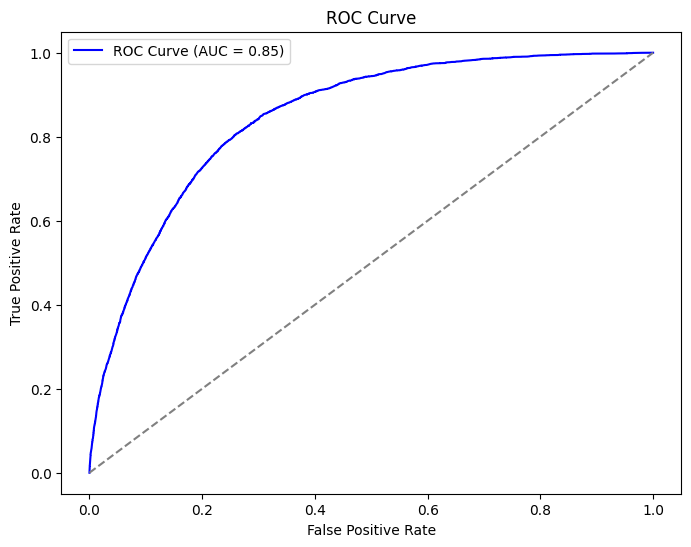

In [ ]:
import matplotlib.pyplot as plt
plt.figure(figsize=(8, 6))
plt.plot(fpr_grid, tpr_grid, color='b', label='ROC Curve (AUC = {:.2f})'.format(roc_auc_grid))
plt.plot([0, 1], [0, 1], color='gray', linestyle='--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve')
plt.legend()
plt.show

In [ ]:
npv_grid = conf_matrix_grid[0, 0] / (conf_matrix_grid[0, 0] + conf_matrix_grid[1, 0])
ppv_grid = conf_matrix_grid[1, 1] / (conf_matrix_grid[0, 1] + conf_matrix_grid[1, 1])
print("NPV and PPV values : ")
print(npv_grid, ppv_grid)

NPV and PPV values : 
0.9141929406105309 0.5763313609467455


Logistic Regression with cross-validation splits for Random Search


In [ ]:
from sklearn.model_selection import RandomizedSearchCV
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
import numpy as np
import time
from sklearn.model_selection import StratifiedKFold

# Define the number of folds for cross-validation
num_folds = 5
stratified_kf = StratifiedKFold(n_splits=num_folds, shuffle=True, random_state=42)

# Split the data using Stratified K-Folds
for train_index, test_index in stratified_kf.split(X, y):
    X_train, X_test = X.iloc[train_index], X.iloc[test_index]
    y_train, y_test = y.iloc[train_index], y.iloc[test_index]

param_distributions = {
    'C': [0.001, 0.01, 0.1, 1, 10, 100],
    'penalty': ['l2', 'none']
}

logreg = LogisticRegression()

start_time = time.time()

# Perform Random Search Cross Validation with Stratified K-Folds
random_search = RandomizedSearchCV(logreg, param_distributions, n_iter=10, cv=stratified_kf, random_state=42)
random_search.fit(X_train, y_train)

end_time = time.time()

# Print the best hyperparameters and accuracy
print("Best Hyperparameters:", random_search.best_params_)
print("Best Accuracy:", random_search.best_score_)

# Evaluate the model on the test data
test_accuracy = random_search.score(X_test, y_test)
print("Test Accuracy:", test_accuracy)
print("Execution Time: {:.2f} seconds".format(end_time - start_time))


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _c

Best Hyperparameters: {'penalty': 'l2', 'C': 0.001}
Best Accuracy: 0.9076838904138628
Test Accuracy: 0.9073438978240302
Execution Time: 133.08 seconds


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


ROC Curve and Metrics

AUC: 0.84
Sensitivity: 0.00
Specificity: 1.00
PPV: 0.55
NPV: 0.91


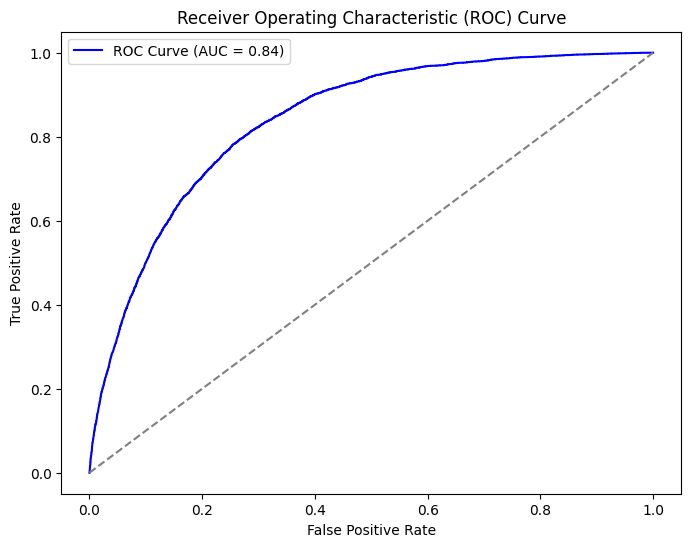

In [ ]:
from sklearn.metrics import roc_curve, roc_auc_score, confusion_matrix

# Assuming you have predicted probabilities from your model
y_pred_proba = random_search.predict_proba(X_test)[:, 1]

# Calculate ROC curve
fpr, tpr, thresholds = roc_curve(y_test, y_pred_proba)

# Calculate AUC (Area Under the Curve) for ROC
roc_auc = roc_auc_score(y_test, y_pred_proba)

# Calculate confusion matrix
y_pred = (y_pred_proba > 0.5).astype(int)  # Using 0.5 as the threshold for binary classification
conf_matrix = confusion_matrix(y_test, y_pred)

# Calculate Sensitivity, Specificity, PPV, NPV
sensitivity = tpr[1]  # True Positive Rate
specificity = 1 - fpr[1]  # True Negative Rate
ppv = conf_matrix[1, 1] / (conf_matrix[1, 1] + conf_matrix[0, 1])  # Positive Predictive Value
npv = conf_matrix[0, 0] / (conf_matrix[0, 0] + conf_matrix[1, 0])  # Negative Predictive Value

# Print metrics
print("AUC: {:.2f}".format(roc_auc))
print("Sensitivity: {:.2f}".format(sensitivity))
print("Specificity: {:.2f}".format(specificity))
print("PPV: {:.2f}".format(ppv))
print("NPV: {:.2f}".format(npv))

# Plot ROC curve
import matplotlib.pyplot as plt

plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='b', label='ROC Curve (AUC = {:.2f})'.format(roc_auc))
plt.plot([0, 1], [0, 1], color='gray', linestyle='--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend()
plt.show()


AdaBoost with cross-validation for Random Search

Randomized Search Test Accuracy: 0.9077
Randomized Search ROC AUC: 0.85
Randomized Search Sensitivity (Recall): 0.14
Randomized Search Specificity: 0.99
Randomized Search PPV: 0.53
Randomized Search NPV: 0.92
Randomized Search F1 Score: 0.23
Execution time: 644.09 seconds


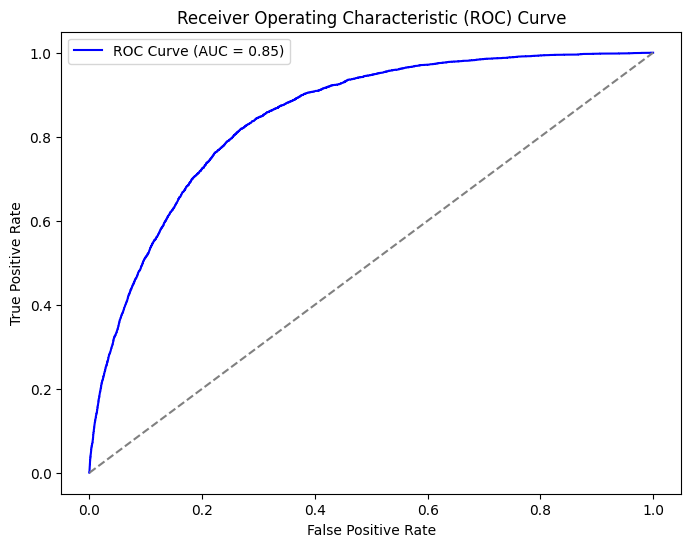

In [ ]:
from sklearn.model_selection import StratifiedKFold
from sklearn.ensemble import AdaBoostClassifier
from sklearn.model_selection import RandomizedSearchCV
from sklearn.metrics import accuracy_score, roc_auc_score, roc_curve, confusion_matrix
from sklearn.metrics import precision_score, recall_score, f1_score

# Define the number of folds for cross-validation
num_folds = 5
stratified_kf = StratifiedKFold(n_splits=num_folds, shuffle=True, random_state=42)

# Initialize RandomizedSearchCV with cross-validation
random_search = RandomizedSearchCV(
    estimator=adaboost,
    param_distributions=param_dist,
    n_iter=10,
    scoring='roc_auc',  # Use ROC AUC as the scoring metric
    cv=stratified_kf,
    n_jobs=-1,
    random_state=42
)

start_time = time.time()

# Fit the model using RandomizedSearchCV with cross-validation on the training data
random_search.fit(X_train, y_train)

end_time = time.time()
tot_time = end_time - start_time

# Get the best estimator from RandomizedSearchCV
best_adaboost_random = random_search.best_estimator_

# Predict probabilities on the test set using the best model
y_proba_random = best_adaboost_random.predict_proba(X_test)[:, 1]

# Calculate ROC AUC score
roc_auc_random = roc_auc_score(y_test, y_proba_random)

# Generate ROC curve
fpr_random, tpr_random, thresholds_random = roc_curve(y_test, y_proba_random)

# Predict on the test set using the best model
y_pred_random = best_adaboost_random.predict(X_test)

# Calculate metrics
accuracy_random = accuracy_score(y_test, y_pred_random)
precision_random = precision_score(y_test, y_pred_random)
recall_random = recall_score(y_test, y_pred_random)
f1_random = f1_score(y_test, y_pred_random)

# Calculate confusion matrix
conf_matrix_random = confusion_matrix(y_test, y_pred_random)

# Calculate Sensitivity, Specificity, PPV, NPV
sensitivity_random = recall_random
specificity_random = conf_matrix_random[0, 0] / (conf_matrix_random[0, 0] + conf_matrix_random[0, 1])
npv_random = conf_matrix_random[0, 0] / (conf_matrix_random[0, 0] + conf_matrix_random[1, 0])
ppv_random = conf_matrix_random[1, 1] / (conf_matrix_random[0, 1] + conf_matrix_random[1, 1])
# Print the results
print("Randomized Search Test Accuracy: {:.4f}".format(accuracy_random))
print("Randomized Search ROC AUC: {:.2f}".format(roc_auc_random))
print("Randomized Search Sensitivity (Recall): {:.2f}".format(sensitivity_random))
print("Randomized Search Specificity: {:.2f}".format(specificity_random))
print("Randomized Search PPV: {:.2f}".format(ppv_random))
print("Randomized Search NPV: {:.2f}".format(npv_random))
print("Randomized Search F1 Score: {:.2f}".format(f1_random))
print("Execution time: {:.2f} seconds".format(tot_time))

# Plot ROC curve
plt.figure(figsize=(8, 6))
plt.plot(fpr_random, tpr_random, color='b', label='ROC Curve (AUC = {:.2f})'.format(roc_auc_random))
plt.plot([0, 1], [0, 1], color='gray', linestyle='--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend()
plt.show()


Voting Classifier with 2 Classifiers - AdaBoost and MLP(with cross-validation split)

In [ ]:
from sklearn.model_selection import RandomizedSearchCV, StratifiedKFold
from sklearn.neural_network import MLPClassifier
from sklearn.ensemble import AdaBoostClassifier, VotingClassifier
from sklearn.model_selection import train_test_split
import numpy as np
import time


st = time.time()
# Assuming you have X and y defined for your features and target variable
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Define hyperparameter grids for MLP and AdaBoost classifiers
mlp_param_dist = {
    'hidden_layer_sizes': [(50,), (100,), (50, 50), (100, 50, 25)],
    'activation': ['logistic'],
    'alpha': [0.0001, 0.001, 0.01]
}

adaboost_param_dist = {
    'n_estimators': [50, 100, 150, 200],
    'learning_rate': [0.01, 0.1, 1, 10]
}
# Create StratifiedKFold cross-validator with 5 splits
stratified_kfold = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

# Perform RandomizedSearchCV for MLP classifier
mlp_random = RandomizedSearchCV(MLPClassifier(random_state=42, max_iter=1000), mlp_param_dist, n_iter=10, cv=stratified_kfold, random_state=42)
mlp_random.fit(X_train, y_train)

# Perform RandomizedSearchCV for AdaBoost classifier
adaboost_random = RandomizedSearchCV(AdaBoostClassifier(random_state=42), adaboost_param_dist, n_iter=10, cv=stratified_kfold, random_state=42)
adaboost_random.fit(X_train, y_train)

# Create a Majority Voting Classifier with tuned individual classifiers
voting_classifier = VotingClassifier(estimators=[
    ('mlp', mlp_random.best_estimator_),
    ('adaboost', adaboost_random.best_estimator_)
], voting='hard')

# Train the voting classifier on the training data
voting_classifier.fit(X_train, y_train)

# Evaluate the model on the test data
test_accuracy = voting_classifier.score(X_test, y_test)
et = time.time()
print("Execution time : ", et-st)
print("Test Accuracy:", test_accuracy)


Execution time :  3946.7249462604523
Test Accuracy: 0.9082111321349732


Voting Classifier with 3 classifiers - RF, MLP and AdaBoost

In [ ]:
from sklearn.model_selection import RandomizedSearchCV, StratifiedKFold, train_test_split
from sklearn.neural_network import MLPClassifier
from sklearn.ensemble import AdaBoostClassifier, RandomForestClassifier, VotingClassifier
import numpy as np
import time

st = time.time()
# Assuming you have X and y defined for your features and target variable

# Split the data into training and test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Define hyperparameter grids for MLP, AdaBoost, and Random Forest classifiers
mlp_param_dist = {
    'hidden_layer_sizes': [(50,), (100,), (50, 50), (100, 50, 25)],
    'activation': ['logistic'],
    'alpha': [0.0001, 0.001, 0.01]
}

adaboost_param_dist = {
    'n_estimators': [50, 100, 150, 200],
    'learning_rate': [0.01, 0.1, 1, 10]
}

random_forest_param_dist = {
    'n_estimators': [50, 100, 150, 200],
    'max_depth': [None, 10, 20, 30],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4]
}

# Create StratifiedKFold cross-validator with 5 splits
stratified_kfold = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

# Perform RandomizedSearchCV for MLP classifier
mlp_random = RandomizedSearchCV(MLPClassifier(random_state=42, max_iter=1000), mlp_param_dist, n_iter=10, cv=stratified_kfold, random_state=42)
mlp_random.fit(X_train, y_train)

# Perform RandomizedSearchCV for AdaBoost classifier
adaboost_random = RandomizedSearchCV(AdaBoostClassifier(random_state=42), adaboost_param_dist, n_iter=10, cv=stratified_kfold, random_state=42)
adaboost_random.fit(X_train, y_train)

# Perform RandomizedSearchCV for Random Forest classifier
random_forest_random = RandomizedSearchCV(RandomForestClassifier(random_state=42), random_forest_param_dist, n_iter=10, cv=stratified_kfold, random_state=42)
random_forest_random.fit(X_train, y_train)

# Create a Majority Voting Classifier with tuned individual classifiers
voting_classifier = VotingClassifier(estimators=[
    ('mlp', mlp_random.best_estimator_),
    ('adaboost', adaboost_random.best_estimator_),
    ('random_forest', random_forest_random.best_estimator_)
], voting='hard')

# Train the voting classifier on the training data
voting_classifier.fit(X_train, y_train)

et = time.time()
# Evaluate the model on the test data
test_accuracy = voting_classifier.score(X_test, y_test)
print("Test Accuracy:", test_accuracy)
print("Execution Time: ",et-st)

Test Accuracy: 0.9083885209713024
Execution Time:  4876.322903394699


Voting Classifier with 4 classifier - RF, MLP, AdaBoost, CatBoost

In [ ]:
!pip install catboost

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 98.7/98.7 MB 8.8 MB/s eta 0:00:00


In [ ]:
from sklearn.ensemble import RandomForestClassifier, VotingClassifier
from sklearn.neural_network import MLPClassifier
from sklearn.ensemble import AdaBoostClassifier
from catboost import CatBoostClassifier
from sklearn.model_selection import RandomizedSearchCV, StratifiedKFold, train_test_split
import numpy as np

# Assuming you have X and y defined for your features and target variable
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Define hyperparameter grids for MLP, AdaBoost, Random Forest, and CatBoost classifiers
mlp_param_dist = {
    'hidden_layer_sizes': [(50,), (100,), (50, 50), (100, 50, 25)],
    'activation': ['logistic'],
    'alpha': [0.0001, 0.001, 0.01]
}

adaboost_param_dist = {
    'n_estimators': [50, 100, 150, 200],
    'learning_rate': [0.01, 0.1, 1, 10]
}

random_forest_param_dist = {
    'n_estimators': [50, 100, 150, 200],
    'max_depth': [None, 10, 20, 30],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4]
}

catboost_param_dist = {
    'iterations': [50, 100, 150],
    'depth': [4, 6, 8, 10],
    'learning_rate': [0.01, 0.05, 0.1],
    'l2_leaf_reg': [1, 3, 5, 7, 9]
}

# Create StratifiedKFold cross-validator with 5 splits
stratified_kfold = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

# Perform RandomizedSearchCV for MLP classifier
mlp_random = RandomizedSearchCV(MLPClassifier(random_state=42, max_iter=1000), mlp_param_dist, n_iter=10, cv=stratified_kfold, random_state=42)
mlp_random.fit(X_train, y_train)

# Perform RandomizedSearchCV for AdaBoost classifier
adaboost_random = RandomizedSearchCV(AdaBoostClassifier(random_state=42), adaboost_param_dist, n_iter=10, cv=stratified_kfold, random_state=42)
adaboost_random.fit(X_train, y_train)

# Perform RandomizedSearchCV for Random Forest classifier
random_forest_random = RandomizedSearchCV(RandomForestClassifier(random_state=42), random_forest_param_dist, n_iter=10, cv=stratified_kfold, random_state=42)
random_forest_random.fit(X_train, y_train)

# Perform RandomizedSearchCV for CatBoost classifier
catboost_random = RandomizedSearchCV(CatBoostClassifier(random_state=42, silent=True), catboost_param_dist, n_iter=10, cv=stratified_kfold, random_state=42)
catboost_random.fit(X_train, y_train)

# Create a Majority Voting Classifier with tuned individual classifiers
voting_classifier = VotingClassifier(estimators=[
    ('mlp', mlp_random.best_estimator_),
    ('adaboost', adaboost_random.best_estimator_),
    ('random_forest', random_forest_random.best_estimator_),
    ('catboost', catboost_random.best_estimator_)
], voting='hard')

# Train the voting classifier on the training data
voting_classifier.fit(X_train, y_train)

# Evaluate the model on the test data
test_accuracy = voting_classifier.score(X_test, y_test)
print("Test Accuracy:", test_accuracy)


Test Accuracy: 0.9083885209713024


Voting Classifier with 5 classifiers - MLP, AdaBoost, CatBoost, RF, XGBoost

In [ ]:
from sklearn.ensemble import RandomForestClassifier, VotingClassifier
from sklearn.neural_network import MLPClassifier
from sklearn.ensemble import AdaBoostClassifier
from catboost import CatBoostClassifier
from xgboost import XGBClassifier
from sklearn.model_selection import RandomizedSearchCV, StratifiedKFold, train_test_split
import numpy as np

# Assuming you have X and y defined for your features and target variable
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Define hyperparameter grids for MLP, AdaBoost, Random Forest, CatBoost, and XGBoost classifiers
mlp_param_dist = {
    'hidden_layer_sizes': [(50,), (100,), (50, 50), (100, 50, 25)],
    'activation': ['logistic'],
    'alpha': [0.0001, 0.001, 0.01]
}

adaboost_param_dist = {
    'n_estimators': [50, 100, 150, 200],
    'learning_rate': [0.01, 0.1, 1, 10]
}

random_forest_param_dist = {
    'n_estimators': [50, 100, 150, 200],
    'max_depth': [None, 10, 20, 30],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4]
}

catboost_param_dist = {
    'iterations': [50, 100, 150],
    'depth': [4, 6, 8, 10],
    'learning_rate': [0.01, 0.05, 0.1],
    'l2_leaf_reg': [1, 3, 5, 7, 9]
}

xgboost_param_dist = {
    'n_estimators': [50, 100, 150, 200],
    'max_depth': [3, 4, 5, 6],
    'learning_rate': [0.01, 0.05, 0.1, 0.2],
    'subsample': [0.6, 0.7, 0.8, 0.9],
    'colsample_bytree': [0.6, 0.7, 0.8, 0.9]
}

# Create StratifiedKFold cross-validator with 5 splits
stratified_kfold = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

# Perform RandomizedSearchCV for MLP classifier
mlp_random = RandomizedSearchCV(MLPClassifier(random_state=42, max_iter=1000), mlp_param_dist, n_iter=10, cv=stratified_kfold, random_state=42)
mlp_random.fit(X_train, y_train)

# Perform RandomizedSearchCV for AdaBoost classifier
adaboost_random = RandomizedSearchCV(AdaBoostClassifier(random_state=42), adaboost_param_dist, n_iter=10, cv=stratified_kfold, random_state=42)
adaboost_random.fit(X_train, y_train)

# Perform RandomizedSearchCV for Random Forest classifier
random_forest_random = RandomizedSearchCV(RandomForestClassifier(random_state=42), random_forest_param_dist, n_iter=10, cv=stratified_kfold, random_state=42)
random_forest_random.fit(X_train, y_train)

# Perform RandomizedSearchCV for CatBoost classifier
catboost_random = RandomizedSearchCV(CatBoostClassifier(random_state=42, silent=True), catboost_param_dist, n_iter=10, cv=stratified_kfold, random_state=42)
catboost_random.fit(X_train, y_train)

# Perform RandomizedSearchCV for XGBoost classifier
xgboost_random = RandomizedSearchCV(XGBClassifier(random_state=42, objective='binary:logistic'), xgboost_param_dist, n_iter=10, cv=stratified_kfold, random_state=42)
xgboost_random.fit(X_train, y_train)

# Create a Majority Voting Classifier with tuned individual classifiers
voting_classifier = VotingClassifier(estimators=[
    ('mlp', mlp_random.best_estimator_),
    ('adaboost', adaboost_random.best_estimator_),
    ('random_forest', random_forest_random.best_estimator_),
    ('catboost', catboost_random.best_estimator_),
    ('xgboost', xgboost_random.best_estimator_)
], voting='hard')

# Train the voting classifier on the training data
voting_classifier.fit(X_train, y_train)

# Evaluate the model on the test data
test_accuracy = voting_classifier.score(X_test, y_test)
print("Test Accuracy:", test_accuracy)


Test Accuracy: 0.9082111321349732


Soft Voting CLassifiers using 2 Classifiers (MLP and AdaBoost)

In [ ]:
from sklearn.model_selection import RandomizedSearchCV, StratifiedKFold
from sklearn.neural_network import MLPClassifier
from sklearn.ensemble import AdaBoostClassifier, VotingClassifier
from sklearn.model_selection import train_test_split
import numpy as np
import time

st = time.time()

# Assuming you have X and y defined for your features and target variable
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Define hyperparameter grids for MLP and AdaBoost classifiers
mlp_param_dist = {
    'hidden_layer_sizes': [(50,), (100,), (50, 50), (100, 50, 25)],
    'activation': ['logistic'],
    'alpha': [0.0001, 0.001, 0.01]
}

adaboost_param_dist = {
    'n_estimators': [50, 100, 150, 200],
    'learning_rate': [0.01, 0.1, 1, 10]
}

# Create StratifiedKFold cross-validator with 5 splits
stratified_kfold = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

# Perform RandomizedSearchCV for MLP classifier
mlp_random = RandomizedSearchCV(MLPClassifier(random_state=42, max_iter=1000), mlp_param_dist, n_iter=10, cv=stratified_kfold, random_state=42)
mlp_random.fit(X_train, y_train)

# Perform RandomizedSearchCV for AdaBoost classifier
adaboost_random = RandomizedSearchCV(AdaBoostClassifier(random_state=42), adaboost_param_dist, n_iter=10, cv=stratified_kfold, random_state=42)
adaboost_random.fit(X_train, y_train)

# Create a Soft Voting Classifier with tuned individual classifiers
soft_voting_classifier = VotingClassifier(estimators=[
    ('mlp', mlp_random.best_estimator_),
    ('adaboost', adaboost_random.best_estimator_)
], voting='soft')

# Train the soft voting classifier on the training data
soft_voting_classifier.fit(X_train, y_train)

# Get class probabilities for each testing sample from MLP
mlp_class_probabilities = mlp_random.best_estimator_.predict_proba(X_test)

# Get class probabilities for each testing sample from AdaBoost
adaboost_class_probabilities = adaboost_random.best_estimator_.predict_proba(X_test)

# Print class probabilities for each testing sample
for i, (mlp_prob, adaboost_prob) in enumerate(zip(mlp_class_probabilities, adaboost_class_probabilities)):
    print(f"Sample {i + 1} - MLP Class 0 Probability: {mlp_prob[0]:.4f}, MLP Class 1 Probability: {mlp_prob[1]:.4f}, "
          f"AdaBoost Class 0 Probability: {adaboost_prob[0]:.4f}, AdaBoost Class 1 Probability: {adaboost_prob[1]:.4f}")

    # Calculate the final predicted class and its probability
    avg_probabilities = np.mean([mlp_prob, adaboost_prob], axis=0)
    final_class = np.argmax(avg_probabilities)
    final_class_probability = avg_probabilities[final_class]

    print(f"    Final Predicted Class: {final_class}, Final Predicted Class Probability: {final_class_probability:.4f}")

# Evaluate the model on the test data
test_accuracy = soft_voting_classifier.score(X_test, y_test)

et = time.time()
print("Execution time: ", et - st)
print("Test Accuracy:", test_accuracy)


Streaming output truncated to the last 5000 lines.
Sample 19214 - MLP Class 0 Probability: 0.9770, MLP Class 1 Probability: 0.0230, AdaBoost Class 0 Probability: 0.5877, AdaBoost Class 1 Probability: 0.4123
    Final Predicted Class: 0, Final Predicted Class Probability: 0.7824
Sample 19215 - MLP Class 0 Probability: 0.9930, MLP Class 1 Probability: 0.0070, AdaBoost Class 0 Probability: 0.5953, AdaBoost Class 1 Probability: 0.4047
    Final Predicted Class: 0, Final Predicted Class Probability: 0.7942
Sample 19216 - MLP Class 0 Probability: 0.9834, MLP Class 1 Probability: 0.0166, AdaBoost Class 0 Probability: 0.5945, AdaBoost Class 1 Probability: 0.4055
    Final Predicted Class: 0, Final Predicted Class Probability: 0.7889
Sample 19217 - MLP Class 0 Probability: 0.9194, MLP Class 1 Probability: 0.0806, AdaBoost Class 0 Probability: 0.5635, AdaBoost Class 1 Probability: 0.4365
    Final Predicted Class: 0, Final Predicted Class Probability: 0.7415
Sample 19218 - MLP Class 0 Probabilit

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Streaming output truncated to the last 5000 lines.
    Final Predicted Class: 0, Final Predicted Class Probability: 0.7837
Sample 34653 - MLP Class 0 Probability: 0.9773, MLP Class 1 Probability: 0.0227, AdaBoost Class 0 Probability: 0.5820, AdaBoost Class 1 Probability: 0.4180
    Final Predicted Class: 0, Final Predicted Class Probability: 0.7797
Sample 34654 - MLP Class 0 Probability: 0.9756, MLP Class 1 Probability: 0.0244, AdaBoost Class 0 Probability: 0.5822, AdaBoost Class 1 Probability: 0.4178
    Final Predicted Class: 0, Final Predicted Class Probability: 0.7789
Sample 34655 - MLP Class 0 Probability: 0.9618, MLP Class 1 Probability: 0.0382, AdaBoost Class 0 Probability: 0.5685, AdaBoost Class 1 Probability: 0.4315
    Final Predicted Class: 0, Final Predicted Class Probability: 0.7652
Sample 34656 - MLP Class 0 Probability: 0.7759, MLP Class 1 Probability: 0.2241, AdaBoost Class 0 Probability: 0.5343, AdaBoost Class 1 Probability: 0.4657
    Final Predicted Class: 0, Final P

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Streaming output truncated to the last 5000 lines.
Sample 48238 - MLP Class 0 Probability: 0.9953, MLP Class 1 Probability: 0.0047, AdaBoost Class 0 Probability: 0.6048, AdaBoost Class 1 Probability: 0.3952
    Final Predicted Class: 0, Final Predicted Class Probability: 0.8001
Sample 48239 - MLP Class 0 Probability: 0.9470, MLP Class 1 Probability: 0.0530, AdaBoost Class 0 Probability: 0.5698, AdaBoost Class 1 Probability: 0.4302
    Final Predicted Class: 0, Final Predicted Class Probability: 0.7584
Sample 48240 - MLP Class 0 Probability: 0.9720, MLP Class 1 Probability: 0.0280, AdaBoost Class 0 Probability: 0.5712, AdaBoost Class 1 Probability: 0.4288
    Final Predicted Class: 0, Final Predicted Class Probability: 0.7716
Sample 48241 - MLP Class 0 Probability: 0.9683, MLP Class 1 Probability: 0.0317, AdaBoost Class 0 Probability: 0.5672, AdaBoost Class 1 Probability: 0.4328
    Final Predicted Class: 0, Final Predicted Class Probability: 0.7678
Sample 48242 - MLP Class 0 Probabilit

ROC curve and Metrics

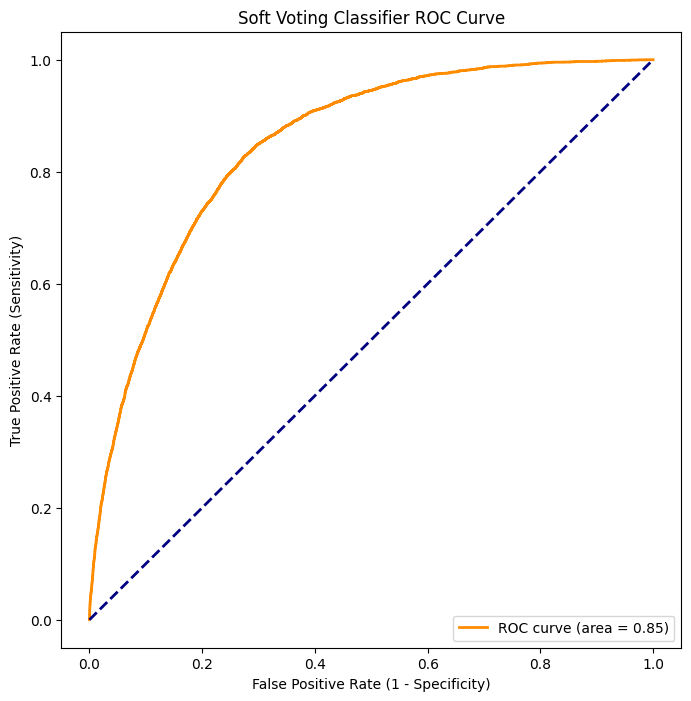

Specificity: 0.9957579185520362
Sensitivity: 0.0625
Negative Predictive Value (NPV): 0.9110323826204645
Positive Predictive Value (PPV): 0.6044624746450304


In [ ]:
from sklearn.metrics import roc_curve, auc, confusion_matrix
import matplotlib.pyplot as plt
# Function to calculate specificity, sensitivity, NPV, and PPV
def calculate_metrics(y_true, y_pred):
    tn, fp, fn, tp = confusion_matrix(y_true, y_pred).ravel()

    specificity = tn / (tn + fp)
    sensitivity = tp / (tp + fn)
    npv = tn / (tn + fn)
    ppv = tp / (tp + fp)

    return specificity, sensitivity, npv, ppv

# Function to plot ROC curve
def plot_roc_curve(y_true, y_probabilities, title='Receiver Operating Characteristic (ROC) Curve'):
    fpr, tpr, thresholds = roc_curve(y_true, y_probabilities[:, 1])
    roc_auc = auc(fpr, tpr)

    plt.figure(figsize=(8, 8))
    plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (area = {:.2f})'.format(roc_auc))
    plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
    plt.xlabel('False Positive Rate (1 - Specificity)')
    plt.ylabel('True Positive Rate (Sensitivity)')
    plt.title(title)
    plt.legend(loc='lower right')
    plt.show()

# Get class probabilities for each testing sample from the Soft Voting Classifier
soft_voting_class_probabilities = soft_voting_classifier.predict_proba(X_test)

# Plot ROC curve for the Soft Voting Classifier
plot_roc_curve(y_test, soft_voting_class_probabilities, title='Soft Voting Classifier ROC Curve')

# Predictions based on the highest probability class
soft_voting_predictions = np.argmax(soft_voting_class_probabilities, axis=1)

# Calculate and print metrics for the Soft Voting Classifier
specificity, sensitivity, npv, ppv = calculate_metrics(y_test, soft_voting_predictions)
print("Specificity:", specificity)
print("Sensitivity:", sensitivity)
print("Negative Predictive Value (NPV):", npv)
print("Positive Predictive Value (PPV):", ppv)

Soft Voting Classifier with 3 classifiers(MLP, AdaBoost, Logistic Regression)

In [ ]:
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import RandomizedSearchCV, StratifiedKFold
from sklearn.neural_network import MLPClassifier
from sklearn.ensemble import AdaBoostClassifier, RandomForestClassifier, VotingClassifier
from sklearn.model_selection import train_test_split
import numpy as np
import time

st = time.time()

# Assuming you have X and y defined for your features and target variable
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

mlp_param_dist = {
    'hidden_layer_sizes': [(50,), (100,), (50, 50), (100, 50, 25)],
    'activation': ['logistic'],
    'alpha': [0.0001, 0.001, 0.01]
}

adaboost_param_dist = {
    'n_estimators': [50, 100, 150, 200],
    'learning_rate': [0.01, 0.1, 1, 10]
}

logistic_param_dist = {
    'C': [0.001, 0.01, 0.1, 1, 10, 100, 1000],
    'penalty': ['l2', None]
}

stratified_kfold = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

# Perform RandomizedSearchCV for MLP classifier
mlp_random = RandomizedSearchCV(MLPClassifier(random_state=42, max_iter=1000), mlp_param_dist, n_iter=10, cv=stratified_kfold, random_state=42)
mlp_random.fit(X_train, y_train)

# Perform RandomizedSearchCV for AdaBoost classifier
adaboost_random = RandomizedSearchCV(AdaBoostClassifier(random_state=42), adaboost_param_dist, n_iter=10, cv=stratified_kfold, random_state=42)
adaboost_random.fit(X_train, y_train)

# Perform RandomizedSearchCV for Logistic Regression classifier
logistic_random = RandomizedSearchCV(LogisticRegression(random_state=42, max_iter=1000), logistic_param_dist, n_iter=10, cv=stratified_kfold, random_state=42)
logistic_random.fit(X_train, y_train)

# Create a Soft Voting Classifier with tuned individual classifiers
soft_voting_classifier = VotingClassifier(estimators=[
    ('mlp', mlp_random.best_estimator_),
    ('adaboost', adaboost_random.best_estimator_),
    ('logistic', logistic_random.best_estimator_)
], voting='soft')

# Train the soft voting classifier on the training data
soft_voting_classifier.fit(X_train, y_train)

# Get class probabilities for each testing sample from MLP
mlp_class_probabilities = mlp_random.best_estimator_.predict_proba(X_test)

# Get class probabilities for each testing sample from AdaBoost
adaboost_class_probabilities = adaboost_random.best_estimator_.predict_proba(X_test)

# Get class probabilities for each testing sample from Logistic Regression
logistic_class_probabilities = logistic_random.best_estimator_.predict_proba(X_test)

# Print class probabilities for each testing sample
for i, (mlp_prob, adaboost_prob, logistic_prob) in enumerate(zip(mlp_class_probabilities, adaboost_class_probabilities, logistic_class_probabilities)):
    print(f"Sample {i + 1} - MLP Class 0 Probability: {mlp_prob[0]:.4f}, MLP Class 1 Probability: {mlp_prob[1]:.4f}, "
          f"AdaBoost Class 0 Probability: {adaboost_prob[0]:.4f}, AdaBoost Class 1 Probability: {adaboost_prob[1]:.4f}, "
          f"Logistic Regression Class 0 Probability: {logistic_prob[0]:.4f}, Logistic Regression Class 1 Probability: {logistic_prob[1]:.4f}")

    # Calculate the final predicted class and its probability
    avg_probabilities = np.mean([mlp_prob, adaboost_prob, logistic_prob], axis=0)
    final_class = np.argmax(avg_probabilities)
    final_class_probability = avg_probabilities[final_class]

    print(f"    Final Predicted Class: {final_class}, Final Predicted Class Probability: {final_class_probability:.4f}")

# Evaluate the model on the test data
test_accuracy = soft_voting_classifier.score(X_test, y_test)

et = time.time()
print("Execution time: ", et - st)
print("Test Accuracy:", test_accuracy)


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:1181: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:1181: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:1181: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:1181: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:1181: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:1181: UserWarning: Setting penalty=None will ignore the C and

Streaming output truncated to the last 5000 lines.
    Final Predicted Class: 0, Final Predicted Class Probability: 0.8778
Sample 16411 - MLP Class 0 Probability: 0.7749, MLP Class 1 Probability: 0.2251, AdaBoost Class 0 Probability: 0.5345, AdaBoost Class 1 Probability: 0.4655, Logistic Regression Class 0 Probability: 0.7979, Logistic Regression Class 1 Probability: 0.2021
    Final Predicted Class: 0, Final Predicted Class Probability: 0.7024
Sample 16412 - MLP Class 0 Probability: 0.8872, MLP Class 1 Probability: 0.1128, AdaBoost Class 0 Probability: 0.5618, AdaBoost Class 1 Probability: 0.4382, Logistic Regression Class 0 Probability: 0.8796, Logistic Regression Class 1 Probability: 0.1204
    Final Predicted Class: 0, Final Predicted Class Probability: 0.7762
Sample 16413 - MLP Class 0 Probability: 0.9714, MLP Class 1 Probability: 0.0286, AdaBoost Class 0 Probability: 0.5740, AdaBoost Class 1 Probability: 0.4260, Logistic Regression Class 0 Probability: 0.9511, Logistic Regression

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Streaming output truncated to the last 5000 lines.
    Final Predicted Class: 0, Final Predicted Class Probability: 0.8429
Sample 32215 - MLP Class 0 Probability: 0.8625, MLP Class 1 Probability: 0.1375, AdaBoost Class 0 Probability: 0.5572, AdaBoost Class 1 Probability: 0.4428, Logistic Regression Class 0 Probability: 0.8468, Logistic Regression Class 1 Probability: 0.1532
    Final Predicted Class: 0, Final Predicted Class Probability: 0.7555
Sample 32216 - MLP Class 0 Probability: 0.9992, MLP Class 1 Probability: 0.0008, AdaBoost Class 0 Probability: 0.6368, AdaBoost Class 1 Probability: 0.3632, Logistic Regression Class 0 Probability: 0.9978, Logistic Regression Class 1 Probability: 0.0022
    Final Predicted Class: 0, Final Predicted Class Probability: 0.8779
Sample 32217 - MLP Class 0 Probability: 0.9439, MLP Class 1 Probability: 0.0561, AdaBoost Class 0 Probability: 0.5713, AdaBoost Class 1 Probability: 0.4287, Logistic Regression Class 0 Probability: 0.9329, Logistic Regression

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Streaming output truncated to the last 5000 lines.
Sample 48238 - MLP Class 0 Probability: 0.9953, MLP Class 1 Probability: 0.0047, AdaBoost Class 0 Probability: 0.6048, AdaBoost Class 1 Probability: 0.3952, Logistic Regression Class 0 Probability: 0.9879, Logistic Regression Class 1 Probability: 0.0121
    Final Predicted Class: 0, Final Predicted Class Probability: 0.8627
Sample 48239 - MLP Class 0 Probability: 0.9470, MLP Class 1 Probability: 0.0530, AdaBoost Class 0 Probability: 0.5698, AdaBoost Class 1 Probability: 0.4302, Logistic Regression Class 0 Probability: 0.9293, Logistic Regression Class 1 Probability: 0.0707
    Final Predicted Class: 0, Final Predicted Class Probability: 0.8154
Sample 48240 - MLP Class 0 Probability: 0.9720, MLP Class 1 Probability: 0.0280, AdaBoost Class 0 Probability: 0.5712, AdaBoost Class 1 Probability: 0.4288, Logistic Regression Class 0 Probability: 0.9507, Logistic Regression Class 1 Probability: 0.0493
    Final Predicted Class: 0, Final Predict

ROC Curve and Metrics

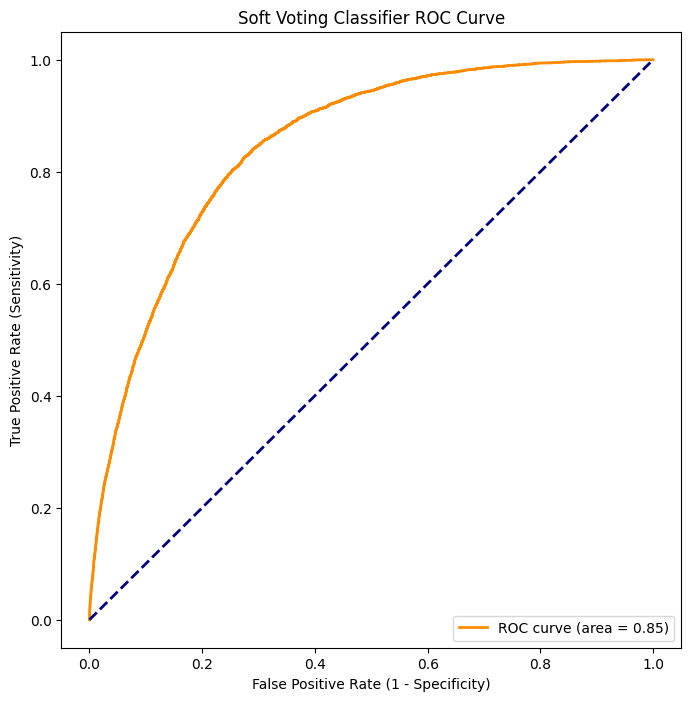

Specificity: 0.9946266968325792
Sensitivity: 0.07550335570469799
Negative Predictive Value (NPV): 0.9120668674818967
Positive Predictive Value (PPV): 0.5930807248764415


In [ ]:
from sklearn.metrics import roc_curve, auc, confusion_matrix
import matplotlib.pyplot as plt

# Function to calculate specificity, sensitivity, NPV, and PPV
def calculate_metrics(y_true, y_pred):
    tn, fp, fn, tp = confusion_matrix(y_true, y_pred).ravel()

    specificity = tn / (tn + fp)
    sensitivity = tp / (tp + fn)
    npv = tn / (tn + fn)
    ppv = tp / (tp + fp)

    return specificity, sensitivity, npv, ppv

# Function to plot ROC curve
def plot_roc_curve(y_true, y_probabilities, title='Receiver Operating Characteristic (ROC) Curve'):
    fpr, tpr, thresholds = roc_curve(y_true, y_probabilities[:, 1])
    roc_auc = auc(fpr, tpr)

    plt.figure(figsize=(8, 8))
    plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (area = {:.2f})'.format(roc_auc))
    plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
    plt.xlabel('False Positive Rate (1 - Specificity)')
    plt.ylabel('True Positive Rate (Sensitivity)')
    plt.title(title)
    plt.legend(loc='lower right')
    plt.show()

# Get class probabilities for each testing sample from the Soft Voting Classifier
soft_voting_class_probabilities = soft_voting_classifier.predict_proba(X_test)

# Plot ROC curve for the Soft Voting Classifier
plot_roc_curve(y_test, soft_voting_class_probabilities, title='Soft Voting Classifier ROC Curve')

# Predictions based on the highest probability class
soft_voting_predictions = np.argmax(soft_voting_class_probabilities, axis=1)

# Calculate and print metrics for the Soft Voting Classifier
specificity, sensitivity, npv, ppv = calculate_metrics(y_test, soft_voting_predictions)
print("Specificity:", specificity)
print("Sensitivity:", sensitivity)
print("Negative Predictive Value (NPV):", npv)
print("Positive Predictive Value (PPV):", ppv)


In [ ]:
!pip install catboost

Soft Voting Classifier with 4 classifiers(MLP, AdaBoost, Logistic Regression and CatBoost)

In [ ]:
from sklearn.model_selection import RandomizedSearchCV, StratifiedKFold
from sklearn.neural_network import MLPClassifier
from sklearn.ensemble import AdaBoostClassifier, VotingClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
from catboost import CatBoostClassifier
import numpy as np
import time
from sklearn.metrics import roc_curve, auc, confusion_matrix
import matplotlib.pyplot as plt

st = time.time()
# Function to calculate specificity, sensitivity, NPV, and PPV
def calculate_metrics(y_true, y_pred):
    tn, fp, fn, tp = confusion_matrix(y_true, y_pred).ravel()

    specificity = tn / (tn + fp)
    sensitivity = tp / (tp + fn)
    npv = tn / (tn + fn)
    ppv = tp / (tp + fp)

    return specificity, sensitivity, npv, ppv

# Function to plot ROC curve
def plot_roc_curve(y_true, y_probabilities, title='Receiver Operating Characteristic (ROC) Curve'):
    fpr, tpr, thresholds = roc_curve(y_true, y_probabilities[:, 1])
    roc_auc = auc(fpr, tpr)

    plt.figure(figsize=(8, 8))
    plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (area = {:.2f})'.format(roc_auc))
    plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
    plt.xlabel('False Positive Rate (1 - Specificity)')
    plt.ylabel('True Positive Rate (Sensitivity)')
    plt.title(title)
    plt.legend(loc='lower right')
    plt.show()

# Assuming you have X and y defined for your features and target variable
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Define hyperparameter grids for MLP, AdaBoost, Logistic Regression, and CatBoost classifiers
mlp_param_dist = {
    'hidden_layer_sizes': [(50,), (100,), (50, 50), (100, 50, 25)],
    'activation': ['logistic'],
    'alpha': [0.0001, 0.001, 0.01]
}

adaboost_param_dist = {
    'n_estimators': [50, 100, 150, 200],
    'learning_rate': [0.01, 0.1, 1, 10]
}

logistic_param_dist = {
    'C': [0.001, 0.01, 0.1, 1, 10, 100, 1000],
    'penalty': ['l2']
}

catboost_param_dist = {
    'iterations': [50, 100, 150],
    'depth': [4, 6, 8, 10],
    'learning_rate': [0.01, 0.05, 0.1],
    'l2_leaf_reg': [1, 3, 5, 7, 9]
}

# Create StratifiedKFold cross-validator with 5 splits
stratified_kfold = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

# Perform RandomizedSearchCV for MLP classifier
mlp_random = RandomizedSearchCV(MLPClassifier(random_state=42, max_iter=1000), mlp_param_dist, n_iter=10, cv=stratified_kfold, random_state=42)
mlp_random.fit(X_train, y_train)

# Perform RandomizedSearchCV for AdaBoost classifier
adaboost_random = RandomizedSearchCV(AdaBoostClassifier(random_state=42), adaboost_param_dist, n_iter=10, cv=stratified_kfold, random_state=42)
adaboost_random.fit(X_train, y_train)

# Perform RandomizedSearchCV for Logistic Regression classifier
logistic_random = RandomizedSearchCV(LogisticRegression(random_state=42, max_iter=1000), logistic_param_dist, n_iter=10, cv=stratified_kfold, random_state=42)
logistic_random.fit(X_train, y_train)

# Perform RandomizedSearchCV for CatBoost classifier
catboost_random = RandomizedSearchCV(CatBoostClassifier(random_state=42, verbose=0), catboost_param_dist, n_iter=10, cv=stratified_kfold, random_state=42)
catboost_random.fit(X_train, y_train)

# Create a Soft Voting Classifier with tuned individual classifiers
soft_voting_classifier = VotingClassifier(estimators=[
    ('mlp', mlp_random.best_estimator_),
    ('adaboost', adaboost_random.best_estimator_),
    ('logistic', logistic_random.best_estimator_),
    ('catboost', catboost_random.best_estimator_)
], voting='soft')

# Train the soft voting classifier on the training data
soft_voting_classifier.fit(X_train, y_train)

# Get class probabilities for each testing sample from MLP
mlp_class_probabilities = mlp_random.best_estimator_.predict_proba(X_test)

# Get class probabilities for each testing sample from AdaBoost
adaboost_class_probabilities = adaboost_random.best_estimator_.predict_proba(X_test)

# Get class probabilities for each testing sample from Logistic Regression
logistic_class_probabilities = logistic_random.best_estimator_.predict_proba(X_test)

# Get class probabilities for each testing sample from CatBoost
catboost_class_probabilities = catboost_random.best_estimator_.predict_proba(X_test)

# Print class probabilities for each testing sample
for i, (mlp_prob, adaboost_prob, logistic_prob, catboost_prob) in enumerate(zip(mlp_class_probabilities, adaboost_class_probabilities, logistic_class_probabilities, catboost_class_probabilities)):
    print(f"Sample {i + 1} - MLP Class 0 Probability: {mlp_prob[0]:.4f}, MLP Class 1 Probability: {mlp_prob[1]:.4f}, "
          f"AdaBoost Class 0 Probability: {adaboost_prob[0]:.4f}, AdaBoost Class 1 Probability: {adaboost_prob[1]:.4f}, "
          f"Logistic Regression Class 0 Probability: {logistic_prob[0]:.4f}, Logistic Regression Class 1 Probability: {logistic_prob[1]:.4f}, "
          f"CatBoost Class 0 Probability: {catboost_prob[0]:.4f}, CatBoost Class 1 Probability: {catboost_prob[1]:.4f}")

    # Calculate the final predicted class and its probability
    avg_probabilities = np.mean([mlp_prob, adaboost_prob, logistic_prob, catboost_prob], axis=0)
    final_class = np.argmax(avg_probabilities)
    final_class_probability = avg_probabilities[final_class]

    print(f"    Final Predicted Class: {final_class}, Final Predicted Class Probability: {final_class_probability:.4f}")

# Evaluate the model on the test data
test_accuracy = soft_voting_classifier.score(X_test, y_test)

et = time.time()
print("Execution time: ", et - st)
print("Test Accuracy:", test_accuracy)


/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_search.py:305: UserWarning: The total space of parameters 7 is smaller than n_iter=10. Running 7 iterations. For exhaustive searches, use GridSearchCV.
  warnings.warn(


Streaming output truncated to the last 5000 lines.
    Final Predicted Class: 0, Final Predicted Class Probability: 0.8908
Sample 4444 - MLP Class 0 Probability: 0.9350, MLP Class 1 Probability: 0.0650, AdaBoost Class 0 Probability: 0.5571, AdaBoost Class 1 Probability: 0.4429, Logistic Regression Class 0 Probability: 0.8950, Logistic Regression Class 1 Probability: 0.1050, CatBoost Class 0 Probability: 0.8874, CatBoost Class 1 Probability: 0.1126
    Final Predicted Class: 0, Final Predicted Class Probability: 0.8186
Sample 4445 - MLP Class 0 Probability: 0.9304, MLP Class 1 Probability: 0.0696, AdaBoost Class 0 Probability: 0.5609, AdaBoost Class 1 Probability: 0.4391, Logistic Regression Class 0 Probability: 0.9235, Logistic Regression Class 1 Probability: 0.0765, CatBoost Class 0 Probability: 0.9344, CatBoost Class 1 Probability: 0.0656
    Final Predicted Class: 0, Final Predicted Class Probability: 0.8373
Sample 4446 - MLP Class 0 Probability: 0.8611, MLP Class 1 Probability: 0.1

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Streaming output truncated to the last 5000 lines.
    Final Predicted Class: 0, Final Predicted Class Probability: 0.8913
Sample 15863 - MLP Class 0 Probability: 0.9441, MLP Class 1 Probability: 0.0559, AdaBoost Class 0 Probability: 0.5680, AdaBoost Class 1 Probability: 0.4320, Logistic Regression Class 0 Probability: 0.9310, Logistic Regression Class 1 Probability: 0.0690, CatBoost Class 0 Probability: 0.9220, CatBoost Class 1 Probability: 0.0780
    Final Predicted Class: 0, Final Predicted Class Probability: 0.8413
Sample 15864 - MLP Class 0 Probability: 0.4286, MLP Class 1 Probability: 0.5714, AdaBoost Class 0 Probability: 0.4964, AdaBoost Class 1 Probability: 0.5036, Logistic Regression Class 0 Probability: 0.4713, Logistic Regression Class 1 Probability: 0.5287, CatBoost Class 0 Probability: 0.4916, CatBoost Class 1 Probability: 0.5084
    Final Predicted Class: 1, Final Predicted Class Probability: 0.5280
Sample 15865 - MLP Class 0 Probability: 0.9809, MLP Class 1 Probability: 

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Streaming output truncated to the last 5000 lines.
    Final Predicted Class: 0, Final Predicted Class Probability: 0.8947
Sample 23616 - MLP Class 0 Probability: 0.9970, MLP Class 1 Probability: 0.0030, AdaBoost Class 0 Probability: 0.6062, AdaBoost Class 1 Probability: 0.3938, Logistic Regression Class 0 Probability: 0.9892, Logistic Regression Class 1 Probability: 0.0108, CatBoost Class 0 Probability: 0.9951, CatBoost Class 1 Probability: 0.0049
    Final Predicted Class: 0, Final Predicted Class Probability: 0.8969
Sample 23617 - MLP Class 0 Probability: 0.9231, MLP Class 1 Probability: 0.0769, AdaBoost Class 0 Probability: 0.5660, AdaBoost Class 1 Probability: 0.4340, Logistic Regression Class 0 Probability: 0.9106, Logistic Regression Class 1 Probability: 0.0894, CatBoost Class 0 Probability: 0.8896, CatBoost Class 1 Probability: 0.1104
    Final Predicted Class: 0, Final Predicted Class Probability: 0.8224
Sample 23618 - MLP Class 0 Probability: 0.9972, MLP Class 1 Probability: 

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Streaming output truncated to the last 5000 lines.
    Final Predicted Class: 1, Final Predicted Class Probability: 0.5710
Sample 36647 - MLP Class 0 Probability: 0.8804, MLP Class 1 Probability: 0.1196, AdaBoost Class 0 Probability: 0.5598, AdaBoost Class 1 Probability: 0.4402, Logistic Regression Class 0 Probability: 0.8962, Logistic Regression Class 1 Probability: 0.1038, CatBoost Class 0 Probability: 0.8988, CatBoost Class 1 Probability: 0.1012
    Final Predicted Class: 0, Final Predicted Class Probability: 0.8088
Sample 36648 - MLP Class 0 Probability: 0.9952, MLP Class 1 Probability: 0.0048, AdaBoost Class 0 Probability: 0.6122, AdaBoost Class 1 Probability: 0.3878, Logistic Regression Class 0 Probability: 0.9876, Logistic Regression Class 1 Probability: 0.0124, CatBoost Class 0 Probability: 0.9951, CatBoost Class 1 Probability: 0.0049
    Final Predicted Class: 0, Final Predicted Class Probability: 0.8975
Sample 36649 - MLP Class 0 Probability: 0.9916, MLP Class 1 Probability: 

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)




Sample 49048 - MLP Class 0 Probability: 0.9644, MLP Class 1 Probability: 0.0356, AdaBoost Class 0 Probability: 0.5773, AdaBoost Class 1 Probability: 0.4227, Logistic Regression Class 0 Probability: 0.9602, Logistic Regression Class 1 Probability: 0.0398, CatBoost Class 0 Probability: 0.9705, CatBoost Class 1 Probability: 0.0295
    Final Predicted Class: 0, Final Predicted Class Probability: 0.8681
Sample 49049 - MLP Class 0 Probability: 0.8758, MLP Class 1 Probability: 0.1242, AdaBoost Class 0 Probability: 0.5504, AdaBoost Class 1 Probability: 0.4496, Logistic Regression Class 0 Probability: 0.8655, Logistic Regression Class 1 Probability: 0.1345, CatBoost Class 0 Probability: 0.8861, CatBoost Class 1 Probability: 0.1139
    Final Predicted Class: 0, Final Predicted Class Probability: 0.7944
Sample 49050 - MLP Class 0 Probability: 0.9978, MLP Class 1 Probability: 0.0022, AdaBoost Class 0 Probability: 0.6167, AdaBoost Class 1 Probability: 0.3833, Logistic Regression Class 0 Probabilit

ROC Curve and Metrics

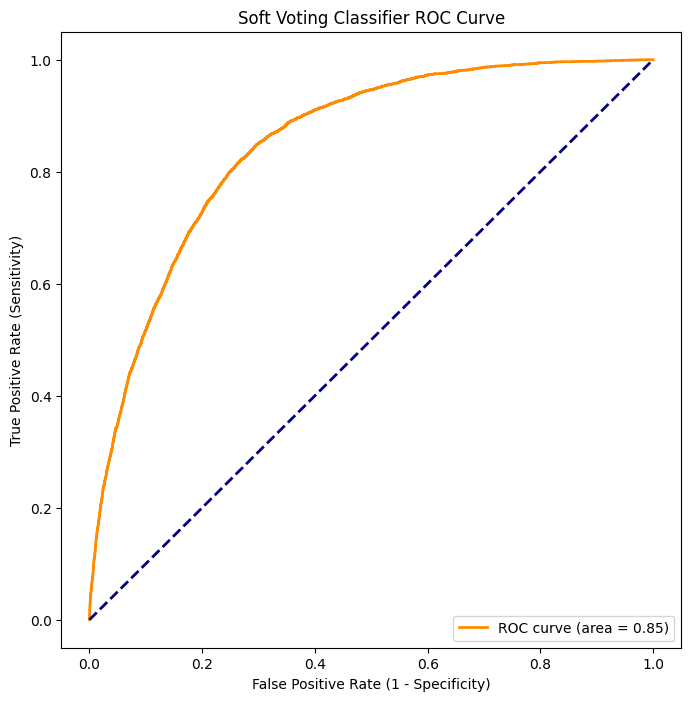

Specificity: 0.994409154194222
Sensitivity: 0.07571308724832215
Negative Predictive Value (NPV): 0.9120675206512631
Positive Predictive Value (PPV): 0.5841423948220065


In [ ]:
soft_voting_class_probabilities = soft_voting_classifier.predict_proba(X_test)
plot_roc_curve(y_test, soft_voting_class_probabilities, title='Soft Voting Classifier ROC Curve')

# Predictions based on the highest probability class
soft_voting_predictions = np.argmax(soft_voting_class_probabilities, axis=1)

# Calculate and print metrics for the Soft Voting Classifier
specificity, sensitivity, npv, ppv = calculate_metrics(y_test, soft_voting_predictions)
print("Specificity:", specificity)
print("Sensitivity:", sensitivity)
print("Negative Predictive Value (NPV):", npv)
print("Positive Predictive Value (PPV):", ppv)


Soft Voting Classifier with 5 classifiers(MLP, AdaBoost, Logistic Regression, CatBoost, XGBoost)

In [ ]:
from sklearn.model_selection import RandomizedSearchCV, StratifiedKFold
from sklearn.neural_network import MLPClassifier
from sklearn.ensemble import AdaBoostClassifier, RandomForestClassifier, VotingClassifier
from sklearn.model_selection import train_test_split
from catboost import CatBoostClassifier
from xgboost import XGBClassifier
import numpy as np
import time

st = time.time()

# Assuming you have X and y defined for your features and target variable
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Define hyperparameter grids for MLP, AdaBoost, Random Forest, CatBoost, and XGBoost classifiers
mlp_param_dist = {
    'hidden_layer_sizes': [(50,), (100,), (50, 50), (100, 50, 25)],
    'activation': ['logistic'],
    'alpha': [0.0001, 0.001, 0.01]
}

adaboost_param_dist = {
    'n_estimators': [50, 100, 150, 200],
    'learning_rate': [0.01, 0.1, 1, 10]
}

logistic_param_dist = {
    'C': [0.001, 0.01, 0.1, 1, 10, 100, 1000],
    'penalty': ['l2', 'none']
}

catboost_param_dist = {
    'iterations': [50, 100, 150],
    'depth': [4, 6, 8, 10],
    'learning_rate': [0.01, 0.05, 0.1],
    'l2_leaf_reg': [1, 3, 5, 7, 9]
}

xgboost_param_dist = {
    'n_estimators': [50, 100, 150, 200],
    'max_depth': [3, 4, 5, 6],
    'learning_rate': [0.01, 0.05, 0.1, 0.2],
    'subsample': [0.6, 0.7, 0.8, 0.9],
    'colsample_bytree': [0.6, 0.7, 0.8, 0.9]
}
##
##
# Create StratifiedKFold cross-validator with 5 splits
stratified_kfold = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

# Perform RandomizedSearchCV for MLP classifier
mlp_random = RandomizedSearchCV(MLPClassifier(random_state=42, max_iter=1000), mlp_param_dist, n_iter=10, cv=stratified_kfold, random_state=42)
mlp_random.fit(X_train, y_train)

# Perform RandomizedSearchCV for AdaBoost classifier
adaboost_random = RandomizedSearchCV(AdaBoostClassifier(random_state=42), adaboost_param_dist, n_iter=10, cv=stratified_kfold, random_state=42)
adaboost_random.fit(X_train, y_train)

logistic_random = RandomizedSearchCV(LogisticRegression(random_state=42, max_iter=1000), logistic_param_dist, n_iter=10, cv=stratified_kfold, random_state=42)
logistic_random.fit(X_train, y_train)

# Perform RandomizedSearchCV for Random Forest classifier
#random_forest_random = RandomizedSearchCV(RandomForestClassifier(random_state=42), random_forest_param_dist, n_iter=10, cv=stratified_kfold, random_state=42)
#random_forest_random.fit(X_train, y_train)

# Perform RandomizedSearchCV for CatBoost classifier
catboost_random = RandomizedSearchCV(CatBoostClassifier(random_state=42, verbose=0), catboost_param_dist, n_iter=10, cv=stratified_kfold, random_state=42)
catboost_random.fit(X_train, y_train)

# Perform RandomizedSearchCV for XGBoost classifier
xgboost_random = RandomizedSearchCV(XGBClassifier(random_state=42, verbosity=0), xgboost_param_dist, n_iter=10, cv=stratified_kfold, random_state=42)
xgboost_random.fit(X_train, y_train)

# Create a Soft Voting Classifier with tuned individual classifiers
soft_voting_classifier = VotingClassifier(estimators=[
    ('mlp', mlp_random.best_estimator_),
    ('adaboost', adaboost_random.best_estimator_),
    ('logistic', logistic_random.best_estimator_),
    ('catboost', catboost_random.best_estimator_),
    ('xgboost', xgboost_random.best_estimator_)
], voting='soft')

# Train the soft voting classifier on the training data
soft_voting_classifier.fit(X_train, y_train)

# Get class probabilities for each testing sample from MLP
mlp_class_probabilities = mlp_random.best_estimator_.predict_proba(X_test)

# Get class probabilities for each testing sample from AdaBoost
adaboost_class_probabilities = adaboost_random.best_estimator_.predict_proba(X_test)

# Get class probabilities for each testing sample from Random Forest
logistic_class_probabilities = logistic_random.best_estimator_.predict_proba(X_test)

# Get class probabilities for each testing sample from CatBoost
catboost_class_probabilities = catboost_random.best_estimator_.predict_proba(X_test)

# Get class probabilities for each testing sample from XGBoost
xgboost_class_probabilities = xgboost_random.best_estimator_.predict_proba(X_test)

# Print class probabilities for each testing sample
for i, (mlp_prob, adaboost_prob, logistic_prob, catboost_prob, xgboost_prob) in enumerate(
        zip(mlp_class_probabilities, adaboost_class_probabilities, logistic_class_probabilities, catboost_class_probabilities, xgboost_class_probabilities)):
    print(f"Sample {i + 1} - MLP Class 0 Probability: {mlp_prob[0]:.4f}, MLP Class 1 Probability: {mlp_prob[1]:.4f}, "
          f"AdaBoost Class 0 Probability: {adaboost_prob[0]:.4f}, AdaBoost Class 1 Probability: {adaboost_prob[1]:.4f}, "
          f"Logistic Regression Class 0 Probability: {logistic_prob[0]:.4f}, Logistic Regression Class 1 Probability: {logistic_prob[1]:.4f}, "
          f"CatBoost Class 0 Probability: {catboost_prob[0]:.4f}, CatBoost Class 1 Probability: {catboost_prob[1]:.4f}, "
          f"XGBoost Class 0 Probability: {xgboost_prob[0]:.4f}, XGBoost Class 1 Probability: {xgboost_prob[1]:.4f}")

    # Calculate the final predicted class and its probability
    avg_probabilities = np.mean([mlp_prob, adaboost_prob, logistic_prob, catboost_prob, xgboost_prob], axis=0)
    final_class = np.argmax(avg_probabilities)
    final_class_probability = avg_probabilities[final_class]

    print(f"    Final Predicted Class: {final_class}, Final Predicted Class Probability: {final_class_probability:.4f}")

# Evaluate the model on the test data
test_accuracy = soft_voting_classifier.score(X_test, y_test)

et = time.time()
print("Execution time: ", et - st)
print("Test Accuracy:", test_accuracy)


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:1173: FutureWarning: `penalty='none'`has been deprecated in 1.2 and will be removed in 1.4. To keep the past behaviour, set `penalty=None`.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:1181: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:1173: FutureWarning: `penalty='none'`has been deprecated in 1.2 and will be removed in 1.4. To keep the past behaviour, set `penalty=None`.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:1181: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:1173: FutureWarning: `penalty='none'`has been deprecated in 1.2 and will be removed in 1.4. To keep the past behaviour

Streaming output truncated to the last 5000 lines.
    Final Predicted Class: 0, Final Predicted Class Probability: 0.7889
Sample 3562 - MLP Class 0 Probability: 0.8216, MLP Class 1 Probability: 0.1784, AdaBoost Class 0 Probability: 0.5423, AdaBoost Class 1 Probability: 0.4577, Logistic Regression Class 0 Probability: 0.8429, Logistic Regression Class 1 Probability: 0.1571, CatBoost Class 0 Probability: 0.8194, CatBoost Class 1 Probability: 0.1806, XGBoost Class 0 Probability: 0.8315, XGBoost Class 1 Probability: 0.1685
    Final Predicted Class: 0, Final Predicted Class Probability: 0.7715
Sample 3563 - MLP Class 0 Probability: 0.8366, MLP Class 1 Probability: 0.1634, AdaBoost Class 0 Probability: 0.5422, AdaBoost Class 1 Probability: 0.4578, Logistic Regression Class 0 Probability: 0.8268, Logistic Regression Class 1 Probability: 0.1732, CatBoost Class 0 Probability: 0.8455, CatBoost Class 1 Probability: 0.1545, XGBoost Class 0 Probability: 0.8477, XGBoost Class 1 Probability: 0.1523

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Streaming output truncated to the last 5000 lines.
    Final Predicted Class: 0, Final Predicted Class Probability: 0.9036
Sample 11921 - MLP Class 0 Probability: 0.9950, MLP Class 1 Probability: 0.0050, AdaBoost Class 0 Probability: 0.6064, AdaBoost Class 1 Probability: 0.3936, Logistic Regression Class 0 Probability: 0.9862, Logistic Regression Class 1 Probability: 0.0138, CatBoost Class 0 Probability: 0.9934, CatBoost Class 1 Probability: 0.0066, XGBoost Class 0 Probability: 0.9899, XGBoost Class 1 Probability: 0.0101
    Final Predicted Class: 0, Final Predicted Class Probability: 0.9142
Sample 11922 - MLP Class 0 Probability: 0.9967, MLP Class 1 Probability: 0.0033, AdaBoost Class 0 Probability: 0.6216, AdaBoost Class 1 Probability: 0.3784, Logistic Regression Class 0 Probability: 0.9924, Logistic Regression Class 1 Probability: 0.0076, CatBoost Class 0 Probability: 0.9933, CatBoost Class 1 Probability: 0.0067, XGBoost Class 0 Probability: 0.9914, XGBoost Class 1 Probability: 0.00

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)




Sample 16575 - MLP Class 0 Probability: 0.8921, MLP Class 1 Probability: 0.1079, AdaBoost Class 0 Probability: 0.5578, AdaBoost Class 1 Probability: 0.4422, Logistic Regression Class 0 Probability: 0.8509, Logistic Regression Class 1 Probability: 0.1491, CatBoost Class 0 Probability: 0.8556, CatBoost Class 1 Probability: 0.1444, XGBoost Class 0 Probability: 0.8533, XGBoost Class 1 Probability: 0.1467
    Final Predicted Class: 0, Final Predicted Class Probability: 0.8019
Sample 16576 - MLP Class 0 Probability: 0.9135, MLP Class 1 Probability: 0.0865, AdaBoost Class 0 Probability: 0.5589, AdaBoost Class 1 Probability: 0.4411, Logistic Regression Class 0 Probability: 0.9085, Logistic Regression Class 1 Probability: 0.0915, CatBoost Class 0 Probability: 0.9264, CatBoost Class 1 Probability: 0.0736, XGBoost Class 0 Probability: 0.9302, XGBoost Class 1 Probability: 0.0698
    Final Predicted Class: 0, Final Predicted Class Probability: 0.8475
Sample 16577 - MLP Class 0 Probability: 0.9174,

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Streaming output truncated to the last 5000 lines.
    Final Predicted Class: 0, Final Predicted Class Probability: 0.9091
Sample 24831 - MLP Class 0 Probability: 0.9750, MLP Class 1 Probability: 0.0250, AdaBoost Class 0 Probability: 0.5833, AdaBoost Class 1 Probability: 0.4167, Logistic Regression Class 0 Probability: 0.9573, Logistic Regression Class 1 Probability: 0.0427, CatBoost Class 0 Probability: 0.9726, CatBoost Class 1 Probability: 0.0274, XGBoost Class 0 Probability: 0.9684, XGBoost Class 1 Probability: 0.0316
    Final Predicted Class: 0, Final Predicted Class Probability: 0.8913
Sample 24832 - MLP Class 0 Probability: 0.9940, MLP Class 1 Probability: 0.0060, AdaBoost Class 0 Probability: 0.5995, AdaBoost Class 1 Probability: 0.4005, Logistic Regression Class 0 Probability: 0.9848, Logistic Regression Class 1 Probability: 0.0152, CatBoost Class 0 Probability: 0.9888, CatBoost Class 1 Probability: 0.0112, XGBoost Class 0 Probability: 0.9879, XGBoost Class 1 Probability: 0.01

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)




Sample 31118 - MLP Class 0 Probability: 0.8391, MLP Class 1 Probability: 0.1609, AdaBoost Class 0 Probability: 0.5386, AdaBoost Class 1 Probability: 0.4614, Logistic Regression Class 0 Probability: 0.8299, Logistic Regression Class 1 Probability: 0.1701, CatBoost Class 0 Probability: 0.8280, CatBoost Class 1 Probability: 0.1720, XGBoost Class 0 Probability: 0.8484, XGBoost Class 1 Probability: 0.1516
    Final Predicted Class: 0, Final Predicted Class Probability: 0.7768
Sample 31119 - MLP Class 0 Probability: 0.9860, MLP Class 1 Probability: 0.0140, AdaBoost Class 0 Probability: 0.5871, AdaBoost Class 1 Probability: 0.4129, Logistic Regression Class 0 Probability: 0.9747, Logistic Regression Class 1 Probability: 0.0253, CatBoost Class 0 Probability: 0.9734, CatBoost Class 1 Probability: 0.0266, XGBoost Class 0 Probability: 0.9774, XGBoost Class 1 Probability: 0.0226
    Final Predicted Class: 0, Final Predicted Class Probability: 0.8997
Sample 31120 - MLP Class 0 Probability: 0.5401,

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Streaming output truncated to the last 5000 lines.
    Final Predicted Class: 0, Final Predicted Class Probability: 0.9104
Sample 38713 - MLP Class 0 Probability: 0.9957, MLP Class 1 Probability: 0.0043, AdaBoost Class 0 Probability: 0.6062, AdaBoost Class 1 Probability: 0.3938, Logistic Regression Class 0 Probability: 0.9882, Logistic Regression Class 1 Probability: 0.0118, CatBoost Class 0 Probability: 0.9930, CatBoost Class 1 Probability: 0.0070, XGBoost Class 0 Probability: 0.9900, XGBoost Class 1 Probability: 0.0100
    Final Predicted Class: 0, Final Predicted Class Probability: 0.9146
Sample 38714 - MLP Class 0 Probability: 0.9518, MLP Class 1 Probability: 0.0482, AdaBoost Class 0 Probability: 0.5750, AdaBoost Class 1 Probability: 0.4250, Logistic Regression Class 0 Probability: 0.9462, Logistic Regression Class 1 Probability: 0.0538, CatBoost Class 0 Probability: 0.9441, CatBoost Class 1 Probability: 0.0559, XGBoost Class 0 Probability: 0.9440, XGBoost Class 1 Probability: 0.05

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



    Final Predicted Class: 0, Final Predicted Class Probability: 0.8523
Sample 43830 - MLP Class 0 Probability: 0.9336, MLP Class 1 Probability: 0.0664, AdaBoost Class 0 Probability: 0.5618, AdaBoost Class 1 Probability: 0.4382, Logistic Regression Class 0 Probability: 0.9213, Logistic Regression Class 1 Probability: 0.0787, CatBoost Class 0 Probability: 0.9360, CatBoost Class 1 Probability: 0.0640, XGBoost Class 0 Probability: 0.9368, XGBoost Class 1 Probability: 0.0632
    Final Predicted Class: 0, Final Predicted Class Probability: 0.8579
Sample 43831 - MLP Class 0 Probability: 0.9150, MLP Class 1 Probability: 0.0850, AdaBoost Class 0 Probability: 0.5520, AdaBoost Class 1 Probability: 0.4480, Logistic Regression Class 0 Probability: 0.9081, Logistic Regression Class 1 Probability: 0.0919, CatBoost Class 0 Probability: 0.9107, CatBoost Class 1 Probability: 0.0893, XGBoost Class 0 Probability: 0.9067, XGBoost Class 1 Probability: 0.0933
    Final Predicted Class: 0, Final Predicted Cl

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Streaming output truncated to the last 5000 lines.
Sample 48238 - MLP Class 0 Probability: 0.9953, MLP Class 1 Probability: 0.0047, AdaBoost Class 0 Probability: 0.6048, AdaBoost Class 1 Probability: 0.3952, Logistic Regression Class 0 Probability: 0.9879, Logistic Regression Class 1 Probability: 0.0121, CatBoost Class 0 Probability: 0.9940, CatBoost Class 1 Probability: 0.0060, XGBoost Class 0 Probability: 0.9896, XGBoost Class 1 Probability: 0.0104
    Final Predicted Class: 0, Final Predicted Class Probability: 0.9143
Sample 48239 - MLP Class 0 Probability: 0.9470, MLP Class 1 Probability: 0.0530, AdaBoost Class 0 Probability: 0.5698, AdaBoost Class 1 Probability: 0.4302, Logistic Regression Class 0 Probability: 0.9293, Logistic Regression Class 1 Probability: 0.0707, CatBoost Class 0 Probability: 0.9235, CatBoost Class 1 Probability: 0.0765, XGBoost Class 0 Probability: 0.9335, XGBoost Class 1 Probability: 0.0665
    Final Predicted Class: 0, Final Predicted Class Probability: 0.86

ROC Curve and Metrics

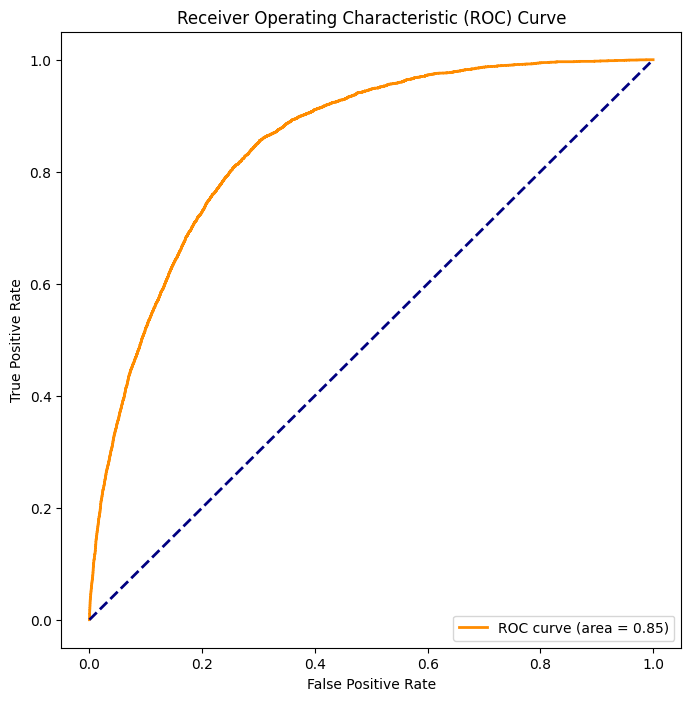

Confusion Matrix:
 [[45706   262]
 [ 4400   368]]
Specificity: 0.9943003828750435
Sensitivity: 0.07718120805369127
Negative Predictive Value (NPV): 0.9121861653295015
Positive Predictive Value (PPV): 0.5841269841269842


In [ ]:
from sklearn.metrics import roc_curve, auc, confusion_matrix, accuracy_score

# Get class probabilities for each testing sample from the Soft Voting Classifier
soft_voting_class_probabilities = soft_voting_classifier.predict_proba(X_test)[:, 1]

# Plot ROC curve for the Soft Voting Classifier
fpr, tpr, thresholds = roc_curve(y_test, soft_voting_class_probabilities)
roc_auc = auc(fpr, tpr)

plt.figure(figsize=(8, 8))
plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (area = {:.2f})'.format(roc_auc))
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc='lower right')
plt.show()

# Predictions based on the highest probability class
soft_voting_predictions = np.round(soft_voting_class_probabilities)

# Calculate confusion matrix
conf_matrix = confusion_matrix(y_test, soft_voting_predictions)

# Calculate specificity, sensitivity, NPV, PPV
tn, fp, fn, tp = conf_matrix.ravel()
specificity = tn / (tn + fp)
sensitivity = tp / (fn + tp)
npv = tn / (tn + fn)
ppv = tp / (fp + tp)


print("Confusion Matrix:\n", conf_matrix)
print("Specificity:", specificity)
print("Sensitivity:", sensitivity)
print("Negative Predictive Value (NPV):", npv)
print("Positive Predictive Value (PPV):", ppv)